<a href="https://colab.research.google.com/github/gimmas/mini-project-teks/blob/main/mini_project_uas_teks_teori.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

5220411167_Muhammad Gimmas Manggara

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


klasifikasi komentar bullying

In [8]:
import nltk
!pip install emoji
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [9]:
import pandas as pd
import numpy as np
!pip install emoji
import emoji
import re
import matplotlib.pyplot as plt
import seaborn as sns
from bs4 import BeautifulSoup
import nltk
import string
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('punkt_tab')
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import *

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [10]:
!pip install sastrawi

In [11]:
# Import the StemmerFactory
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import nltk # Import nltk for tokenization

# Download necessary NLTK data
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt')
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')
try:
    nltk.data.find('tokenizers/punkt_tab')
except LookupError:
    nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [12]:
!pip install google-play-scraper
from google_play_scraper import reviews, Sort, app

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00


In [13]:
result11, continuation_token = reviews('com.google.android.youtube',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=5)
result12, continuation_token = reviews('com.google.android.youtube',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=3)
result13, continuation_token = reviews('com.google.android.youtube',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=2)

In [14]:
result21, continuation_token = reviews('com.ss.android.ugc.trill',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=5)
result22, continuation_token = reviews('com.ss.android.ugc.trill',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=3)
result23, continuation_token = reviews('com.ss.android.ugc.trill',
                                     lang ='id',
                                     country ='id',
                                     sort = Sort.NEWEST,
                                     count =2200,
                                     filter_score_with=1)

In [15]:
combined_results1 = []
combined_results1.extend(result11)
combined_results1.extend(result12)
combined_results1.extend(result13)
df_result1 = pd.DataFrame(combined_results1)

combined_results2 = []
combined_results2.extend(result21)
combined_results2.extend(result22)
combined_results2.extend(result23)
df_result2 = pd.DataFrame(combined_results2)

print("Head of df_result1:")
display(df_result1.head())

print("\nHead of df_result2:")
display(df_result2.head())

print("\nConfirmation: The 'result' variables have been successfully separated into df_result1 and df_result2.")

Head of df_result1:


,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,290bbd55-7d58-4f4f-9234-f895de0a7ddf,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,Nice,5,0,20.44.36,2025-12-27 18:03:11,None,None,20.44.36
1,46544e5f-7364-49d9-8091-b0eba355b61d,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,YOuTube,5,0,19.20.33,2025-12-27 17:54:46,None,None,19.20.33
2,28bd19a6-ac60-4a8f-be87-8544190c4478,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,Sangat bagus skali,5,0,10.18.55,2025-12-27 17:47:38,None,None,10.18.55
3,5725ec32-2fa7-4d28-9b24-9925e4b00126,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,saya memperbarui YouTube saya di hp baru,5,0,19.20.33,2025-12-27 17:46:02,None,None,19.20.33
4,a24069cc-3dc1-41c9-9ca1-8fe3770fec05,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,Oke,5,0,18.22.36,2025-12-27 17:45:50,None,None,18.22.36



Head of df_result2:


,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,c4b90654-f6ca-40b8-b416-492a27876097,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,Sangat mudah di gunakan,5,0,42.6.4,2025-12-27 18:02:21,None,NaT,42.6.4
1,c076b6f3-08e1-4fbc-a955-f38d32b36bc1,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,0,43.1.4,2025-12-27 18:01:27,None,NaT,43.1.4
2,c35e9e9e-7940-4b8a-ae31-0b6b87b209fb,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,hai developer saya hanya ingin memberi saran a...,5,0,43.1.4,2025-12-27 17:56:10,None,NaT,43.1.4
3,7e1f8ef2-72c4-4cc1-aa95-08b728659364,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,baguss,5,0,None,2025-12-27 17:47:28,Hai! Terima kasih telah meluangkan waktu untuk...,2025-12-28 18:00:03,None
4,be7e9b01-af47-4fe5-ab47-1d95645c1581,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,bagus,5,0,None,2025-12-27 17:31:16,Hai! Terima kasih telah meluangkan waktu untuk...,2025-12-28 18:00:04,None



Confirmation: The 'result' variables have been successfully separated into df_result1 and df_result2.


In [16]:
df_result2

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,c4b90654-f6ca-40b8-b416-492a27876097,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,Sangat mudah di gunakan,5,0,42.6.4,2025-12-27 18:02:21,None,NaT,42.6.4
1,c076b6f3-08e1-4fbc-a955-f38d32b36bc1,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,0,43.1.4,2025-12-27 18:01:27,None,NaT,43.1.4
2,c35e9e9e-7940-4b8a-ae31-0b6b87b209fb,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,hai developer saya hanya ingin memberi saran a...,5,0,43.1.4,2025-12-27 17:56:10,None,NaT,43.1.4
3,7e1f8ef2-72c4-4cc1-aa95-08b728659364,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,baguss,5,0,None,2025-12-27 17:47:28,Hai! Terima kasih telah meluangkan waktu untuk...,2025-12-28 18:00:03,None
4,be7e9b01-af47-4fe5-ab47-1d95645c1581,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,bagus,5,0,None,2025-12-27 17:31:16,Hai! Terima kasih telah meluangkan waktu untuk...,2025-12-28 18:00:04,None
...,...,...,...,...,...,...,...,...,...,...,...
6595,f02c96ce-eb77-4502-9e6e-85623f7fc92a,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,WHAT DO YOU MEAN OFFICIALLY AND LEGALLY 18 YEA...,1,0,43.0.3,2025-12-15 16:08:55,None,NaT,43.0.3
6596,5f9a0d61-7272-4520-88aa-59fa1ab24235,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,ga usah ada fitur saldo ribet ajg,1,0,42.9.3,2025-12-15 15:53:49,None,NaT,42.9.3
6597,09aa7c01-481c-404e-a673-b27fd737cb40,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,akun saya keblokir selamanya padahal tidak nga...,1,0,42.9.3,2025-12-15 15:52:56,None,NaT,42.9.3
6598,189342f5-17db-4b57-8ceb-8448e9f52fc9,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2N...,"parah lama, betul pas update",1,0,42.9.3,2025-12-15 15:45:24,None,NaT,42.9.3


In [17]:
df_result1.shape

(6600, 11)

In [18]:
df_result2.shape

(6600, 11)

In [19]:
df_result1.columns

Index(['reviewId', 'userName', 'userImage', 'content', 'score',
       'thumbsUpCount', 'reviewCreatedVersion', 'at', 'replyContent',
       'repliedAt', 'appVersion'],
      dtype='object')

In [20]:
df_result1 = df_result1[['content', 'score']]
df_result2 = df_result2[['content', 'score']]

In [21]:
df_result1.columns

Index(['content', 'score'], dtype='object')

In [22]:
df_result1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6600 entries, 0 to 6599
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  6600 non-null   object
 1   score    6600 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 103.3+ KB


In [23]:
df_result2.isnull().sum()

,0
content,0
score,0


In [24]:
df_result1.isnull().sum()

,0
content,0
score,0


In [25]:
print("Null values in df_result1 before dropping:")
display(df_result1.isnull().sum())

print("\nNull values in df_result2 before dropping:")
display(df_result2.isnull().sum())

# Drop rows with any null values from df_result1
df_result1.dropna(inplace=True)

print("\nNull values in df_result1 after dropping:")
display(df_result1.isnull().sum())
print(f"\nShape of df_result1 after dropping nulls: {df_result1.shape}")

# Drop rows with any null values from df_result2
df_result2.dropna(inplace=True)

print("\nNull values in df_result2 after dropping:")
display(df_result2.isnull().sum())

Null values in df_result1 before dropping:


,0
content,0
score,0



Null values in df_result2 before dropping:


,0
content,0
score,0



Null values in df_result1 after dropping:


,0
content,0
score,0



Shape of df_result1 after dropping nulls: (6600, 2)

Null values in df_result2 after dropping:


/tmp/ipython-input-590485806.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2.dropna(inplace=True)


,0
content,0
score,0


In [26]:
df_result1.duplicated().any()

np.True_

In [27]:
df_result2.duplicated().any()

np.True_

In [28]:
df_result1.drop_duplicates(inplace=True)
df_result2.drop_duplicates(inplace=True)

/tmp/ipython-input-774071138.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2.drop_duplicates(inplace=True)


In [29]:
df_result2.duplicated().any()

np.False_

In [30]:
df_result1.shape

(5252, 2)

In [31]:
df_result2.shape

(5873, 2)

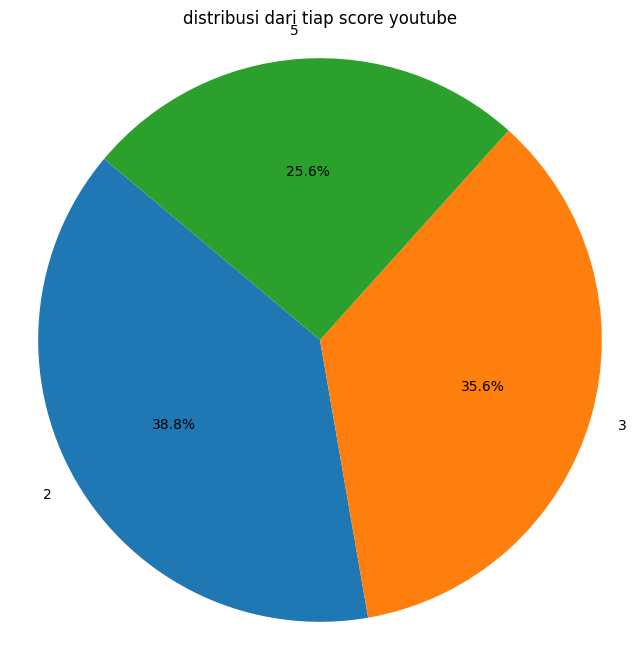

In [32]:
# mengitung jumlah tiap label
category = df_result1['score'].value_counts()

#plotting the pie chart
plt.figure(figsize=(8,8))
plt.pie(category.values, labels=category.index, autopct='%1.1f%%', startangle=140)
plt.title('distribusi dari tiap score youtube')
plt.axis('equal')#memastikan diagram pie digambar dalam bentuk lingkaran
plt.show()

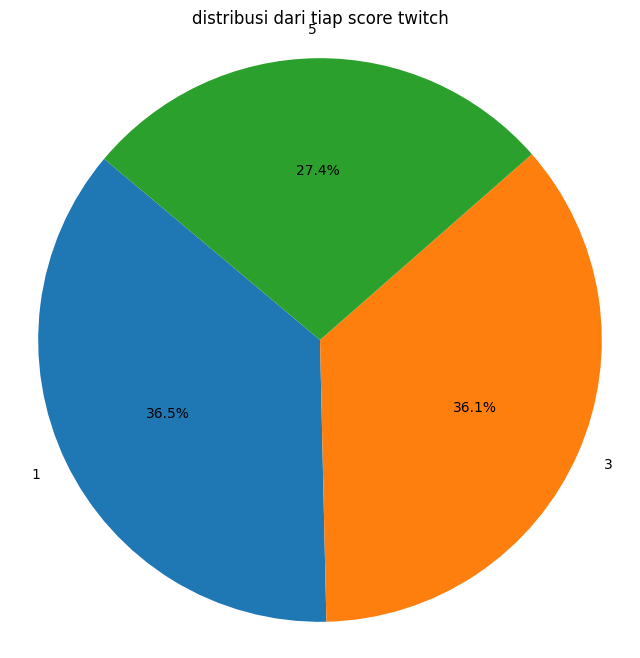

In [33]:
# mengitung jumlah tiap label
category = df_result2['score'].value_counts()

#plotting the pie chart
plt.figure(figsize=(8,8))
plt.pie(category.values, labels=category.index, autopct='%1.1f%%', startangle=140)
plt.title('distribusi dari tiap score twitch')
plt.axis('equal')#memastikan diagram pie digambar dalam bentuk lingkaran
plt.show()

In [34]:
df_result2

,content,score
0,Sangat mudah di gunakan,5
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5
2,hai developer saya hanya ingin memberi saran a...,5
3,baguss,5
4,bagus,5
...,...,...
6595,WHAT DO YOU MEAN OFFICIALLY AND LEGALLY 18 YEA...,1
6596,ga usah ada fitur saldo ribet ajg,1
6597,akun saya keblokir selamanya padahal tidak nga...,1
6598,"parah lama, betul pas update",1


In [35]:
score_mapping = {5: 'positive', 3: 'neutral', 2: 'negative', 1: 'negative'}

df_result1.loc[:, 'score_cat'] = df_result1['score'].map(score_mapping)
df_result2.loc[:, 'score_cat'] = df_result2['score'].map(score_mapping)

print("Head of df_result1 with new 'score_cat' column:")
display(df_result1.head())

print("\nHead of df_result2 with new 'score_cat' column:")
display(df_result2.head())

Head of df_result1 with new 'score_cat' column:


/tmp/ipython-input-2587052079.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2.loc[:, 'score_cat'] = df_result2['score'].map(score_mapping)


,content,score,score_cat
0,Nice,5,positive
1,YOuTube,5,positive
2,Sangat bagus skali,5,positive
3,saya memperbarui YouTube saya di hp baru,5,positive
4,Oke,5,positive



Head of df_result2 with new 'score_cat' column:


,content,score,score_cat
0,Sangat mudah di gunakan,5,positive
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive
2,hai developer saya hanya ingin memberi saran a...,5,positive
3,baguss,5,positive
4,bagus,5,positive


In [36]:
df_result1.head()
#

,content,score,score_cat
0,Nice,5,positive
1,YOuTube,5,positive
2,Sangat bagus skali,5,positive
3,saya memperbarui YouTube saya di hp baru,5,positive
4,Oke,5,positive


text preprocessing  

In [37]:
# Define the file paths for the dictionaries
slang_file_path = '/content/drive/MyDrive/Tugas/TEKS/kamus/slang.csv'
non_standard_file_path = '/content/drive/MyDrive/Tugas/TEKS/kamus/kamuskatabaku.xlsx'

# Read the slang CSV file into a pandas DataFrame
try:
    slang_df = pd.read_csv(slang_file_path)
    print(f"Successfully read data from {slang_file_path}")
    display(slang_df.head())
except FileNotFoundError:
    print(f"Error: The file {slang_file_path} was not found.")
except Exception as e:
    print(f"An error occurred while reading the CSV file: {e}")

# Read the non-standard word Excel file into a pandas DataFrame
try:
    non_standard_df = pd.read_excel(non_standard_file_path)
    print(f"\nSuccessfully read data from {non_standard_file_path}")
    display(non_standard_df.head())
except FileNotFoundError:
    print(f"Error: The file {non_standard_file_path} was not found.")
except Exception as e:
    print(f"An error occurred while reading the Excel file: {e}")

Successfully read data from /content/drive/MyDrive/Tugas/TEKS/kamus/slang.csv


,slang,formal
0,udah,sudah
1,gua,aku
2,ntar,nanti
3,be like,seperti
4,aja,saja



Successfully read data from /content/drive/MyDrive/Tugas/TEKS/kamus/kamuskatabaku.xlsx


,tidak_baku,kata_baku
0,woww,wow
1,aminn,amin
2,met,selamat
3,netaas,menetas
4,keberpa,keberapa


In [38]:
# Create dictionaries for mapping slang and non-standard words
slang_dict = dict(zip(slang_df['slang'], slang_df['formal']))

# Filter non_standard_df to remove rows where 'kata_baku' is NaN before creating the dictionary
non_standard_df_cleaned = non_standard_df.dropna(subset=['kata_baku'])
non_standard_dict = dict(zip(non_standard_df_cleaned['tidak_baku'], non_standard_df_cleaned['kata_baku']))

# Function to replace words using the dictionaries
def replace_words(text):
    if not isinstance(text, str):
        # Convert non-string inputs to string, handling NaN explicitly by returning an empty string
        return str(text) if not pd.isna(text) else ""
    words = text.split()
    # Ensure any value retrieved from dicts is explicitly converted to a string before joining
    replaced_words = [str(slang_dict.get(word, non_standard_dict.get(word, word))) for word in words]
    return ' '.join(replaced_words)


print("Head of df_result1 after word replacement:")
display(df_result1.head())
print("\nHead of df_result2 after word replacement:")
display(df_result2.head())

Head of df_result1 after word replacement:


,content,score,score_cat
0,Nice,5,positive
1,YOuTube,5,positive
2,Sangat bagus skali,5,positive
3,saya memperbarui YouTube saya di hp baru,5,positive
4,Oke,5,positive



Head of df_result2 after word replacement:


,content,score,score_cat
0,Sangat mudah di gunakan,5,positive
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive
2,hai developer saya hanya ingin memberi saran a...,5,positive
3,baguss,5,positive
4,bagus,5,positive


In [39]:
#fungsi hapus tag html
def remove_html(text):
  soup = BeautifulSoup(text, 'html.parser')
  return soup.get_text()

In [40]:
#fungsi hapus url
def remove_url(text):
  return re.sub(r'http\S+', '', text)


In [41]:
#fungsi hapus emoji
def remove_emoji(text):
    # Ensure text is a string
    if not isinstance(text, str):
        return text
    emoji_pattern = re.compile(
        "["
        "\U0001F600-\U0001F64F"  # Emoticons
        "\U0001F300-\U0001F5FF"  # Symbols and Pictographs
        "\U0001F680-\U0001F6FF"  # Transport and Map Symbols
        "\U0001F1E0-\U0001F1FF"  # Flags (iOS)
        "\U00002500-\U00002B50"  # Box Drawing and Miscellaneous Symbols
        "\U00002700-\U000027BF"  # Dingbats
        "\U0000FE00-\U0000FE0F"  # Variation Selectors
        "\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
        "\U0001FA00-\U0001FA6F"  # Chess Symbols
        "\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
        "\U0000200D" # Zero Width Joiner
        "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [42]:
#whitespace
def remove_whitespace(text):
  return ' '.join(text.split())

In [43]:
#angka dan tanda baca
def remove_number(text):
  return re.sub(r'[^a-z\s]', '', text)



In [44]:
# Import the StemmerFactory
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import nltk # Import nltk for tokenization

# Create stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Function to perform stemming on a list of tokens
def stem_tokens(tokens):
    # Ensure tokens is a list
    if not isinstance(tokens, list):
        return []
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    return stemmed_tokens



In [45]:
import nltk
from nltk.corpus import stopwords

# Download Indonesian stop words (if not already downloaded)
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

# Get the list of Indonesian stop words
stop_words = set(stopwords.words('indonesian'))

In [46]:
import nltk
from nltk.corpus import stopwords

# Download Indonesian stop words (if not already downloaded)
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

# Get the list of Indonesian stop words and add 'ya' explicitly
stop_words = set(stopwords.words('indonesian'))
stop_words.add('ya') # Explicitly add 'ya' to the stop
stop_words.add('sih') # Explicitly add 'iya' to the stop
stop_words.add('tiktok') # Add 'tiktok' to stopwords
stop_words.add('tik') # Add 'yt' to stopwords
stop_words.add('tok') # Add 'yt' to stopwords
stop_words.add('youtube') # Add 'youtube' to stopwords
stop_words.add('aplikasi') # Add 'yt' to stopwords

# Function to remove stop words from a list of tokens
def remove_stopwords(tokens):
    # Ensure tokens is a list
    if not isinstance(tokens, list):
        return []
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return filtered_tokens

In [47]:
df_result1['normal']=df_result1['content'].apply(replace_words)
df_result2['normal']=df_result2['content'].apply(replace_words)

/tmp/ipython-input-1117593991.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['normal']=df_result2['content'].apply(replace_words)


In [48]:
df_result1['processed']=df_result1['normal'].str.lower()
df_result2['processed']=df_result2['normal'].str.lower()

/tmp/ipython-input-1792375242.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed']=df_result2['normal'].str.lower()


In [49]:
df_result2.head()

,content,score,score_cat,normal,processed
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,sangat mudah di gunakan
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,sangat buat aq senang.aq bsh belajar nyayi dan...
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer aku hanya ingin memberi saran ag...
3,baguss,5,positive,bagus,bagus
4,bagus,5,positive,bagus,bagus


In [50]:
df_result1['processed'] = df_result1['processed'].apply(remove_html)
df_result2['processed'] = df_result2['processed'].apply(remove_html)

/tmp/ipython-input-3920968095.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(remove_html)


In [51]:
df_result1.head()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,nice
1,YOuTube,5,positive,YOuTube,youtube
2,Sangat bagus skali,5,positive,Sangat bagus sekali,sangat bagus sekali
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,aku memperbarui youtube aku di hp baru
4,Oke,5,positive,Oke,oke


In [52]:
df_result1['processed'] = df_result1['processed'].apply(remove_url)
df_result2['processed'] = df_result2['processed'].apply(remove_url)

/tmp/ipython-input-27758226.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(remove_url)


In [53]:
df_result1.head()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,nice
1,YOuTube,5,positive,YOuTube,youtube
2,Sangat bagus skali,5,positive,Sangat bagus sekali,sangat bagus sekali
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,aku memperbarui youtube aku di hp baru
4,Oke,5,positive,Oke,oke


In [54]:
df_result1['processed'] = df_result1['processed'].apply(remove_emoji)
df_result2['processed'] = df_result2['processed'].apply(remove_emoji)

/tmp/ipython-input-3635972252.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(remove_emoji)


In [55]:
df_result1.head()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,nice
1,YOuTube,5,positive,YOuTube,youtube
2,Sangat bagus skali,5,positive,Sangat bagus sekali,sangat bagus sekali
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,aku memperbarui youtube aku di hp baru
4,Oke,5,positive,Oke,oke


In [56]:
df_result1['processed'] = df_result1['processed'].apply(remove_whitespace)
df_result2['processed'] = df_result2['processed'].apply(remove_whitespace)

/tmp/ipython-input-3551753692.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(remove_whitespace)


In [57]:
df_result1.head()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,nice
1,YOuTube,5,positive,YOuTube,youtube
2,Sangat bagus skali,5,positive,Sangat bagus sekali,sangat bagus sekali
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,aku memperbarui youtube aku di hp baru
4,Oke,5,positive,Oke,oke


In [58]:
df_result1['processed'] = df_result1['processed'].apply(remove_number)
df_result2['processed'] = df_result2['processed'].apply(remove_number)

/tmp/ipython-input-2071575332.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(remove_number)


In [59]:
df_result1.head(20)

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,nice
1,YOuTube,5,positive,YOuTube,youtube
2,Sangat bagus skali,5,positive,Sangat bagus sekali,sangat bagus sekali
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,aku memperbarui youtube aku di hp baru
4,Oke,5,positive,Oke,oke
5,Ok,5,positive,Ok,ok
6,sangat berguna,5,positive,sangat berguna,sangat berguna
7,mantap,5,positive,mantap,mantap
8,mantaaaaab,5,positive,mantaaaaab,mantaaaaab
9,bagus,5,positive,bagus,bagus


In [60]:
df_result1['processed'] = df_result1['processed'].apply(replace_words)
df_result2['processed'] = df_result2['processed'].apply(replace_words)

/tmp/ipython-input-600186445.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['processed'] = df_result2['processed'].apply(replace_words)


In [61]:
# Apply tokenization to the 'processed' column
df_result1.loc[:, 'processed'] = df_result1['processed'].apply(nltk.word_tokenize)
df_result2.loc[:, 'processed'] = df_result2['processed'].apply(nltk.word_tokenize)
print("Tokenization re-applied.")

Tokenization re-applied.


In [62]:
df_result1.head(30)

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,[baik]
1,YOuTube,5,positive,YOuTube,[youtube]
2,Sangat bagus skali,5,positive,Sangat bagus sekali,"[sangat, bagus, sekali]"
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,"[aku, memperbarui, youtube, aku, di, hp, baru]"
4,Oke,5,positive,Oke,[baik]
5,Ok,5,positive,Ok,[baik]
6,sangat berguna,5,positive,sangat berguna,"[sangat, berguna]"
7,mantap,5,positive,mantap,[mantap]
8,mantaaaaab,5,positive,mantaaaaab,[mantaaaaab]
9,bagus,5,positive,bagus,[bagus]


In [63]:
df_result1.loc[:, 'processed'] = df_result1['processed'].apply(remove_stopwords)
df_result2.loc[:, 'processed'] = df_result2['processed'].apply(remove_stopwords)
print("Stopword removal re-applied.")

Stopword removal re-applied.


In [64]:
df_result1.head(50)

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,[]
1,YOuTube,5,positive,YOuTube,[]
2,Sangat bagus skali,5,positive,Sangat bagus sekali,[bagus]
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,"[memperbarui, hp]"
4,Oke,5,positive,Oke,[]
5,Ok,5,positive,Ok,[]
6,sangat berguna,5,positive,sangat berguna,[berguna]
7,mantap,5,positive,mantap,[mantap]
8,mantaaaaab,5,positive,mantaaaaab,[mantaaaaab]
9,bagus,5,positive,bagus,[bagus]


In [65]:
df_result1.loc[:, 'processed'] = df_result1['processed'].apply(stem_tokens)
print("Stemming for df_result1 re-applied.")

Stemming for df_result1 re-applied.


In [66]:
df_result2.loc[:, 'processed'] = df_result2['processed'].apply(stem_tokens)
print("Stemming for df_result2 re-applied.")

Stemming for df_result2 re-applied.


In [67]:
df_result1.head()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,[]
1,YOuTube,5,positive,YOuTube,[]
2,Sangat bagus skali,5,positive,Sangat bagus sekali,[bagus]
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,"[baru, hp]"
4,Oke,5,positive,Oke,[]


In [68]:
df_result2.head()

,content,score,score_cat,normal,processed
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,[mudah]
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,"[senangaq, bsh, ajar, nyayi, konten, terimakasih]"
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,"[hai, developer, saran, hapus, postingan, suka..."
3,baguss,5,positive,bagus,[bagus]
4,bagus,5,positive,bagus,[bagus]


In [69]:
def join_tokens(tokens):
    if isinstance(tokens, list):
        return ' '.join(tokens)
    return "" # Return empty string for non-list inputs

print("Joining tokens in 'processed' column...")
df_result1.loc[:, 'processed'] = df_result1['processed'].apply(join_tokens)
df_result2.loc[:, 'processed'] = df_result2['processed'].apply(join_tokens)
print("Tokens re-joined successfully.")

print("\nHead of df_result1 after re-joining tokens:")
display(df_result1.head())
print("\nHead of df_result2 after re-joining tokens:")
display(df_result2.head())

Joining tokens in 'processed' column...
Tokens re-joined successfully.

Head of df_result1 after re-joining tokens:


,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,
1,YOuTube,5,positive,YOuTube,
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp
4,Oke,5,positive,Oke,



Head of df_result2 after re-joining tokens:


,content,score,score_cat,normal,processed
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,mudah
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,senangaq bsh ajar nyayi konten terimakasih
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer saran hapus postingan sukaidi su...
3,baguss,5,positive,bagus,bagus
4,bagus,5,positive,bagus,bagus


In [70]:
df_result2.isnull().sum()

,0
content,0
score,0
score_cat,0
normal,0
processed,0


In [71]:
df_result1.isnull().sum()

,0
content,0
score,0
score_cat,0
normal,0
processed,0


In [72]:
df_result1.dropna()
df_result1.dropna()

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,
1,YOuTube,5,positive,YOuTube,
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp
4,Oke,5,positive,Oke,
...,...,...,...,...,...
6595,Jadi Kurang puas Soalnya semenjak YouTube upda...,2,negative,Jadi Kurang puas Soalnya semenjak YouTube upda...,puas semenjak update versi baru lihat durasi l...
6596,"you tubeku gk bs di buka, mau'y di update doan...",2,negative,"kamu tubeku tidak bisa di buka, mau'y di updat...",tube buka mauy update doang tutul update lariy...
6597,translate bermasalah,2,negative,translate bermasalah,translate masalah
6598,YouTube nya gk bisa kebuka diperangkat ini,2,negative,YouTube ya tidak bisa kebuka diperangkat ini,buka perangkat


In [73]:
df_result1

,content,score,score_cat,normal,processed
0,Nice,5,positive,Nice,
1,YOuTube,5,positive,YOuTube,
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp
4,Oke,5,positive,Oke,
...,...,...,...,...,...
6595,Jadi Kurang puas Soalnya semenjak YouTube upda...,2,negative,Jadi Kurang puas Soalnya semenjak YouTube upda...,puas semenjak update versi baru lihat durasi l...
6596,"you tubeku gk bs di buka, mau'y di update doan...",2,negative,"kamu tubeku tidak bisa di buka, mau'y di updat...",tube buka mauy update doang tutul update lariy...
6597,translate bermasalah,2,negative,translate bermasalah,translate masalah
6598,YouTube nya gk bisa kebuka diperangkat ini,2,negative,YouTube ya tidak bisa kebuka diperangkat ini,buka perangkat


In [74]:
df_result2

,content,score,score_cat,normal,processed
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,mudah
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,senangaq bsh ajar nyayi konten terimakasih
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer saran hapus postingan sukaidi su...
3,baguss,5,positive,bagus,bagus
4,bagus,5,positive,bagus,bagus
...,...,...,...,...,...
6595,WHAT DO YOU MEAN OFFICIALLY AND LEGALLY 18 YEA...,1,negative,WHAT DO YOU MEAN OFFICIALLY AND LEGALLY 18 YEA...,mean officially legally year old kena batas us...
6596,ga usah ada fitur saldo ribet ajg,1,negative,tidak usah ada fitur saldo ribet anjing,fitur saldo ribet anjing
6597,akun saya keblokir selamanya padahal tidak nga...,1,negative,akun aku keblokir selamanya padahal tidak apa apa,akun blokir
6598,"parah lama, betul pas update",1,negative,"parah lama, betul pas update",parah pas update


In [75]:
df_result1['normal2']=df_result1['processed'].apply(replace_words)
df_result2['normal2']=df_result2['processed'].apply(replace_words)

/tmp/ipython-input-3406717381.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['normal2']=df_result2['processed'].apply(replace_words)


In [76]:
df_result1.head()

,content,score,score_cat,normal,processed,normal2
0,Nice,5,positive,Nice,,
1,YOuTube,5,positive,YOuTube,,
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus,bagus
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp,baru hp
4,Oke,5,positive,Oke,,


In [77]:
df_result2.head()

,content,score,score_cat,normal,processed,normal2
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,mudah,mudah
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,senangaq bsh ajar nyayi konten terimakasih,senangaq bsh ajar nyayi konten terimakasih
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer saran hapus postingan sukaidi su...,hai developer saran hapus postingan sukaidi su...
3,baguss,5,positive,bagus,bagus,bagus
4,bagus,5,positive,bagus,bagus,bagus


Visual dari non lexicon

In [78]:
from nltk.probability import FreqDist
import nltk

def get_most_common_words_by_category(df, df_name, num_words=10):
    print(f"\n--- Most Common Words for {df_name} by Score Category ---")
    for category in df['score_cat'].unique():
        if pd.isna(category): # Skip NaN categories if any remain
            continue
        print(f"\nCategory: {category}")
        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Calculate word frequency
        fdist_category = FreqDist(words_category)

        # Get the most common words
        most_common_words = fdist_category.most_common(num_words)

        if most_common_words:
            for word, frequency in most_common_words:
                print(f"  {word}: {frequency}")
        else:
            print("  No words found for this category.")

# Get most common words for df_result1 by score_cat
get_most_common_words_by_category(df_result1, 'df_result1')

# Get most common words for df_result2 by score_cat
get_most_common_words_by_category(df_result2, 'df_result2')


--- Most Common Words for df_result1 by Score Category ---

Category: positive
  bagus: 252
  tonton: 108
  buka: 104
  suka: 102
  seru: 49
  bantu: 48
  tube: 46
  tolong: 42
  mantap: 41
  hibur: 38

Category: neutral
  video: 341
  iklan: 323
  tolong: 272
  buka: 255
  bagus: 253
  tonton: 203
  update: 179
  baik: 163
  suka: 134
  ganggu: 127

Category: negative
  iklan: 486
  video: 356
  buka: 321
  tolong: 296
  tonton: 253
  update: 200
  ganggu: 165
  bagus: 164
  baik: 153
  suka: 111

--- Most Common Words for df_result2 by Score Category ---

Category: positive
  bagus: 502
  suka: 180
  seru: 147
  hibur: 108
  tolong: 94
  tonton: 75
  akun: 73
  mantap: 64
  baik: 58
  apk: 57

Category: neutral
  tolong: 389
  akun: 329
  bagus: 311
  lambat: 212
  live: 203
  baik: 201
  buka: 193
  video: 173
  update: 172
  suka: 172

Category: negative
  akun: 452
  tolong: 295
  lambat: 197
  buka: 190
  blokir: 170
  baik: 164
  video: 160
  live: 160
  apk: 150
  virus: 146



--- Visualizing Most Common Words for df_result1 (YouTube) by Score Category ---
Processing category: positive
Processing category: neutral


/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


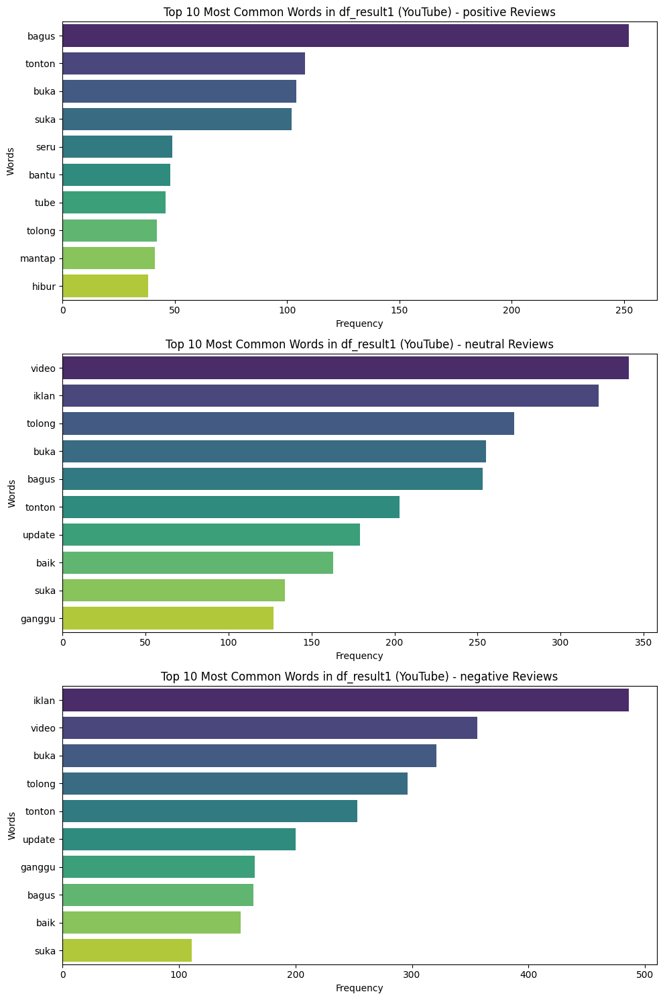


--- Visualizing Most Common Words for df_result2 (TikTok) by Score Category ---
Processing category: positive
Processing category: neutral
Processing category: negative


/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
/tmp/ipython-input-3942803965.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


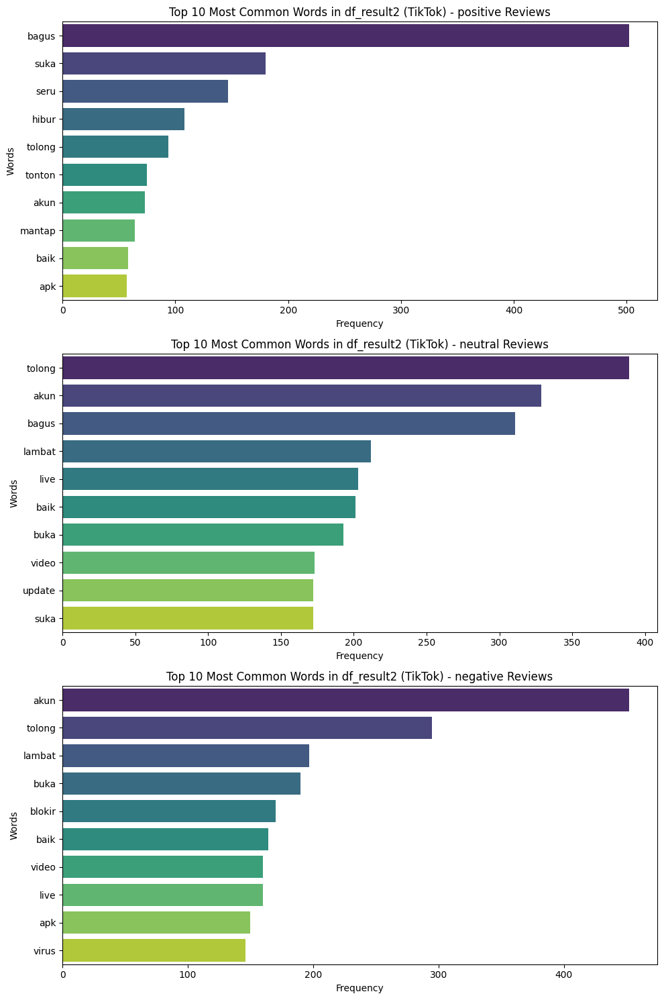

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
import nltk

def plot_most_common_words(df, df_name, num_words=10):
    print(f"\n--- Visualizing Most Common Words for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Calculate word frequency
        fdist_category = FreqDist(words_category)

        # Get the most common words
        most_common_words = fdist_category.most_common(num_words)

        if most_common_words:
            words = [word for word, freq in most_common_words]
            frequencies = [freq for word, freq in most_common_words]

            sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_words} Most Common Words in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Words')
        else:
            ax.text(0.5, 0.5, 'No words found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_words} Most Common Words in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common words for df_result1 by score_cat
plot_most_common_words(df_result1, 'df_result1 (YouTube)')

# Plot most common words for df_result2 by score_cat
plot_most_common_words(df_result2, 'df_result2 (TikTok)')


--- Generating Word Clouds for df_result1 (YouTube) by Score Category ---
Generating word cloud for positive category in df_result1 (YouTube)...


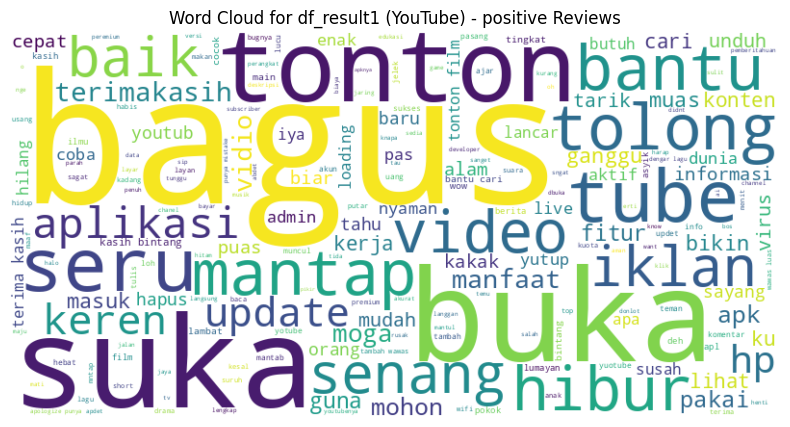

Generating word cloud for neutral category in df_result1 (YouTube)...


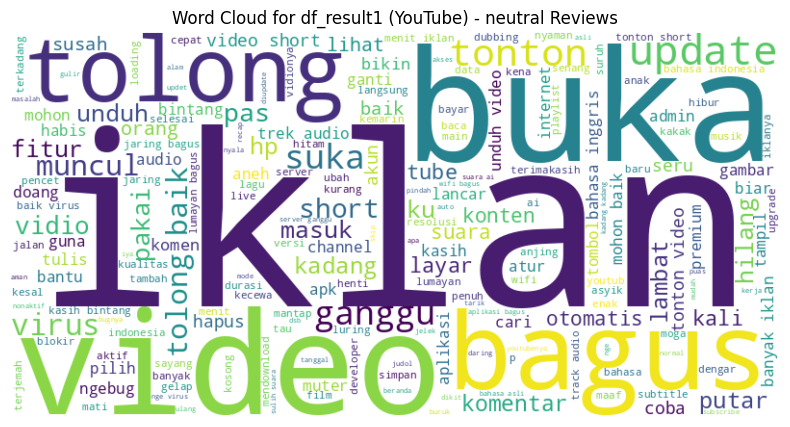

Generating word cloud for negative category in df_result1 (YouTube)...


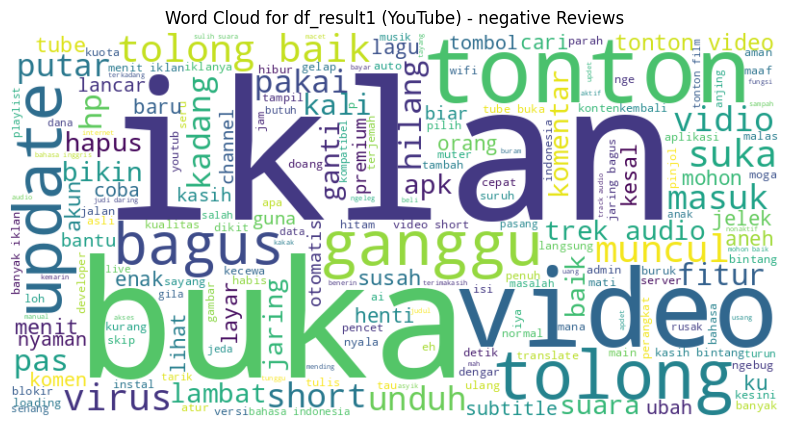


--- Generating Word Clouds for df_result2 (TikTok) by Score Category ---
Generating word cloud for positive category in df_result2 (TikTok)...


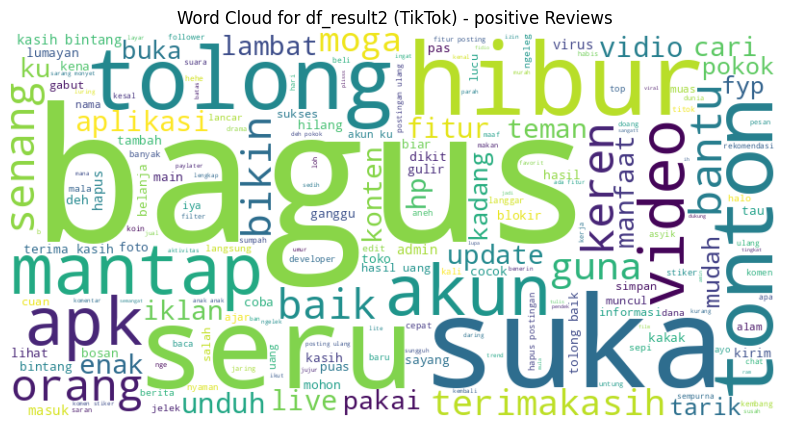

Generating word cloud for neutral category in df_result2 (TikTok)...


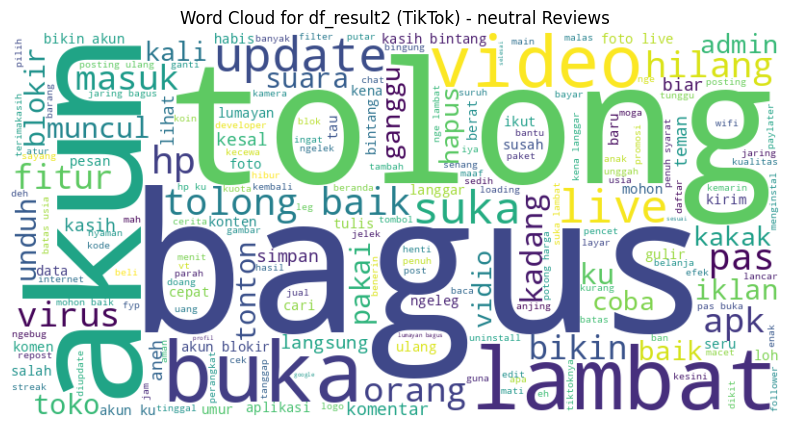

Generating word cloud for negative category in df_result2 (TikTok)...


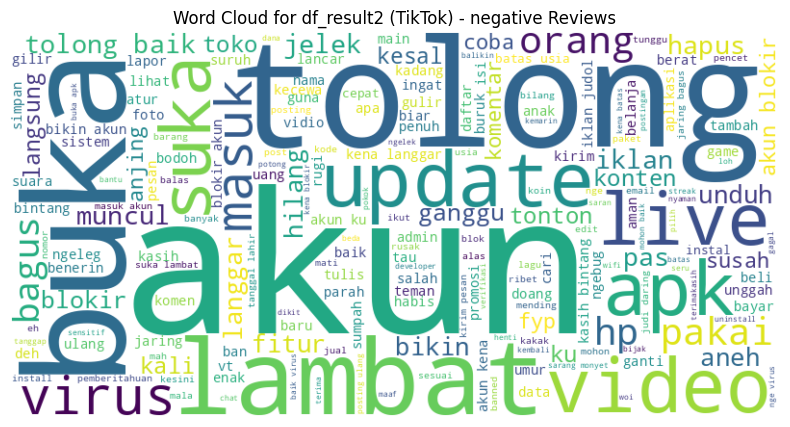

In [80]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_word_clouds(df, df_name):
    print(f"\n--- Generating Word Clouds for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Generate word cloud
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_processed_text_category)

            # Display the generated image:
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'Word Cloud for {df_name} - {category} Reviews')
            plt.axis('off')
            plt.show()
        else:
            print(f"No text available to generate word cloud for {category} category in {df_name}.")

# Generate word clouds for df_result1 (YouTube)
generate_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate word clouds for df_result2 (TikTok)
generate_word_clouds(df_result2, 'df_result2 (TikTok)')

In [81]:
from nltk.probability import FreqDist
from nltk.util import bigrams
import nltk

def get_most_common_bigrams_by_category(df, df_name, num_bigrams=10):
    print(f"\n--- Most Common Bigrams for {df_name} by Score Category ---")
    for category in df['score_cat'].unique():
        if pd.isna(category):  # Skip NaN categories
            continue
        print(f"\nCategory: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate bigrams
        bigrams_category = list(bigrams(words_category))

        # Calculate bigram frequency
        fdist_bigrams = FreqDist(bigrams_category)

        # Get the most common bigrams
        most_common_bigrams = fdist_bigrams.most_common(num_bigrams)

        if most_common_bigrams:
            for bigram_pair, frequency in most_common_bigrams:
                print(f"  {' '.join(bigram_pair)}: {frequency}")
        else:
            print("  No bigrams found for this category.")

# Get most common bigrams for df_result1 by score_cat
get_most_common_bigrams_by_category(df_result1, 'df_result1 (YouTube)')

# Get most common bigrams for df_result2 by score_cat
get_most_common_bigrams_by_category(df_result2, 'df_result2 (TikTok)')


--- Most Common Bigrams for df_result1 (YouTube) by Score Category ---

Category: positive
  bagus bagus: 22
  suka tonton: 13
  bagus tonton: 12
  bagus suka: 11
  aplikasi bagus: 11
  tonton video: 10
  bagus buka: 9
  terima kasih: 8
  tonton film: 8
  buka bagus: 8

Category: neutral
  tolong baik: 88
  tonton video: 33
  trek audio: 24
  video short: 23
  bahasa inggris: 22
  mohon baik: 22
  banyak iklan: 21
  kasih bintang: 20
  unduh video: 19
  bahasa indonesia: 19

Category: negative
  tolong baik: 101
  trek audio: 48
  tonton video: 41
  iklan iklan: 38
  kasih bintang: 25
  menit iklan: 24
  jaring bagus: 24
  banyak iklan: 22
  tube buka: 17
  muncul iklan: 17

--- Most Common Bigrams for df_result2 (TikTok) by Score Category ---

Category: positive
  bagus bagus: 47
  bagus suka: 27
  kasih bintang: 24
  bagus seru: 20
  tolong baik: 18
  bagus hibur: 17
  seru bagus: 17
  apk bagus: 15
  suka suka: 14
  hibur bagus: 14

Category: neutral
  tolong baik: 114
  kasih bint


--- Visualizing Most Common Bigrams for df_result1 (YouTube) by Score Category ---
Processing category: positive


/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


Processing category: neutral
Processing category: negative


/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


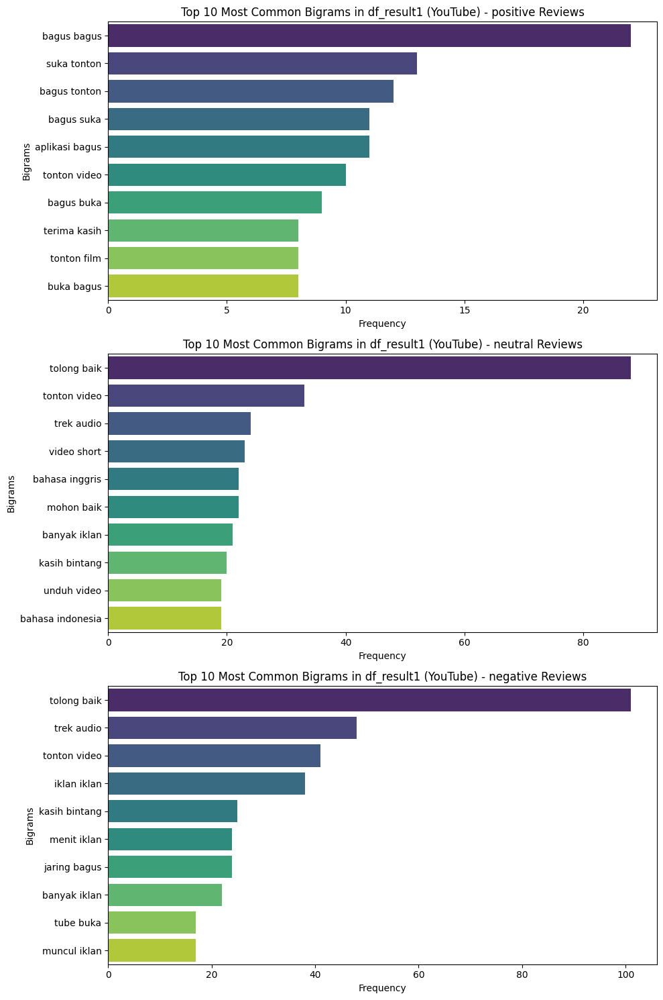


--- Visualizing Most Common Bigrams for df_result2 (TikTok) by Score Category ---
Processing category: positive


/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


Processing category: neutral


/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-3659554463.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


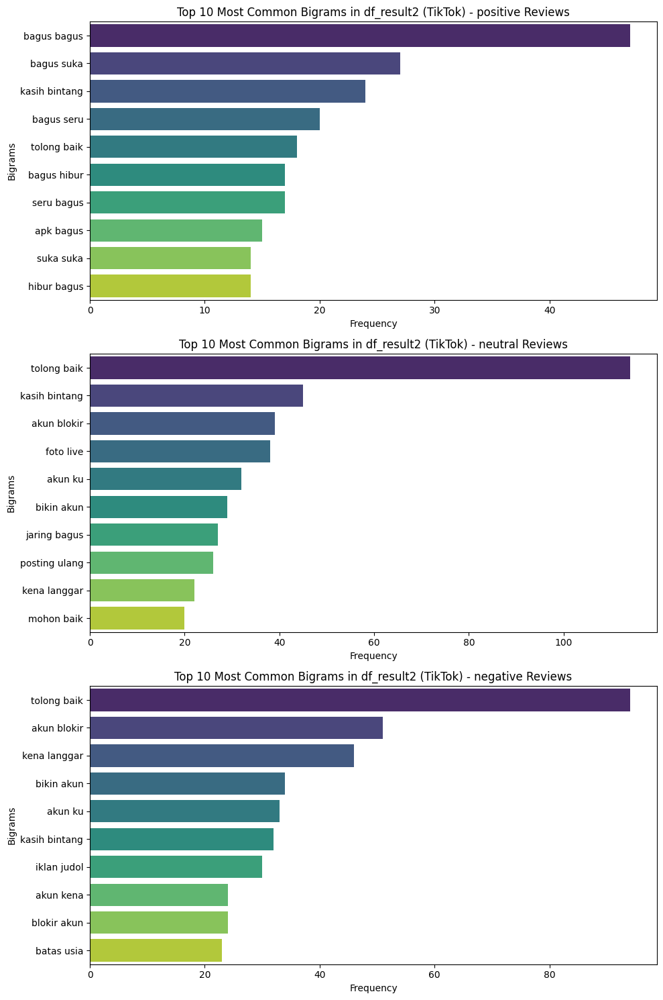

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
from nltk.util import bigrams
import nltk

def plot_most_common_bigrams(df, df_name, num_bigrams=10):
    print(f"\n--- Visualizing Most Common Bigrams for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate bigrams
        bigrams_category = list(bigrams(words_category))

        # Calculate bigram frequency
        fdist_bigrams = FreqDist(bigrams_category)

        # Get the most common bigrams
        most_common_bigrams = fdist_bigrams.most_common(num_bigrams)

        if most_common_bigrams:
            # Prepare data for plotting
            bigram_labels = [' '.join(bigram_pair) for bigram_pair, freq in most_common_bigrams]
            frequencies = [freq for bigram_pair, freq in most_common_bigrams]

            sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_bigrams} Most Common Bigrams in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Bigrams')
        else:
            ax.text(0.5, 0.5, 'No bigrams found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_bigrams} Most Common Bigrams in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common bigrams for df_result1 by score_cat
plot_most_common_bigrams(df_result1, 'df_result1 (YouTube)')

# Plot most common bigrams for df_result2 by score_cat
plot_most_common_bigrams(df_result2, 'df_result2 (TikTok)')


--- Generating Bigram Word Clouds for df_result1 (YouTube) by Score Category ---
Generating bigram word cloud for positive category in df_result1 (YouTube)...


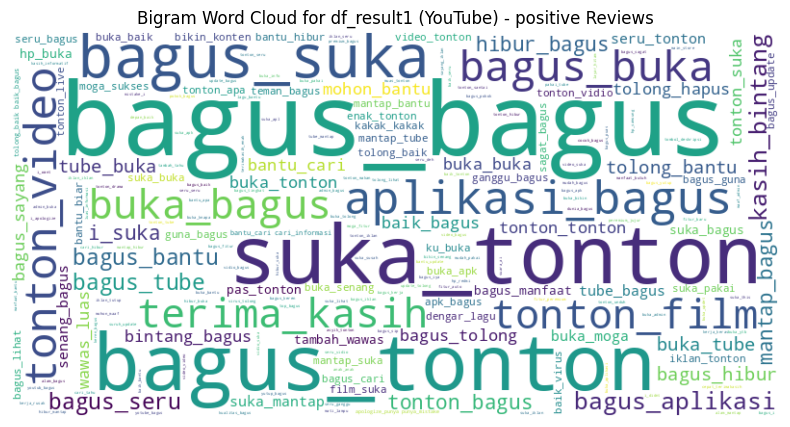

Generating bigram word cloud for neutral category in df_result1 (YouTube)...


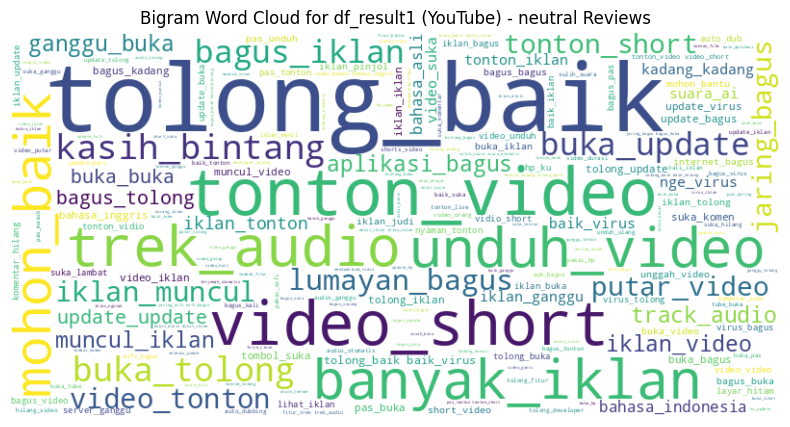

Generating bigram word cloud for negative category in df_result1 (YouTube)...


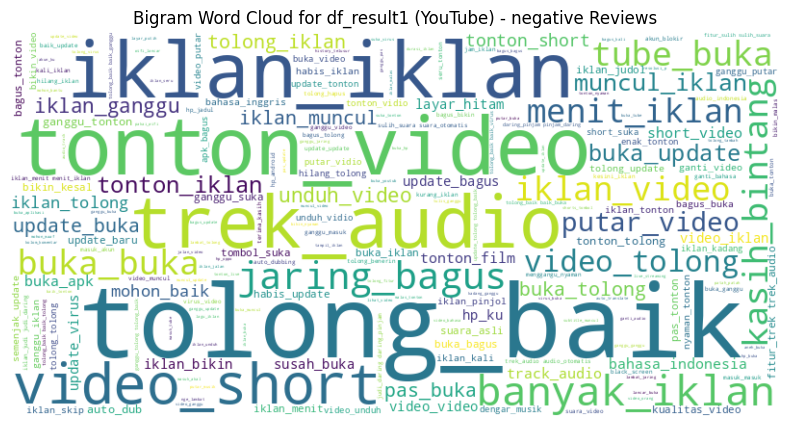


--- Generating Bigram Word Clouds for df_result2 (TikTok) by Score Category ---
Generating bigram word cloud for positive category in df_result2 (TikTok)...


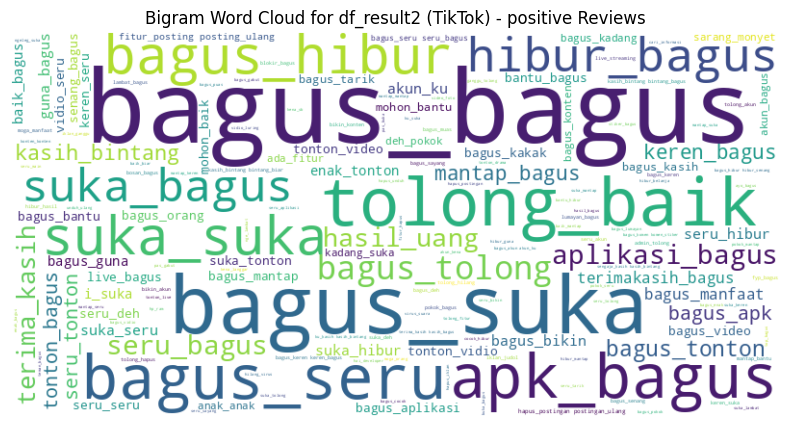

Generating bigram word cloud for neutral category in df_result2 (TikTok)...


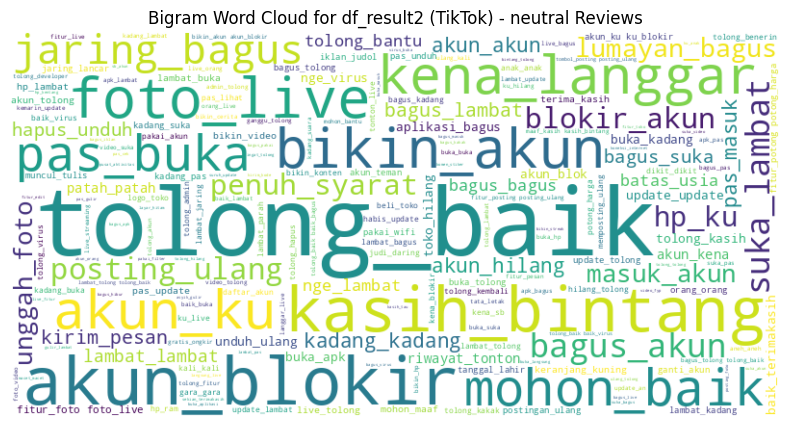

Generating bigram word cloud for negative category in df_result2 (TikTok)...


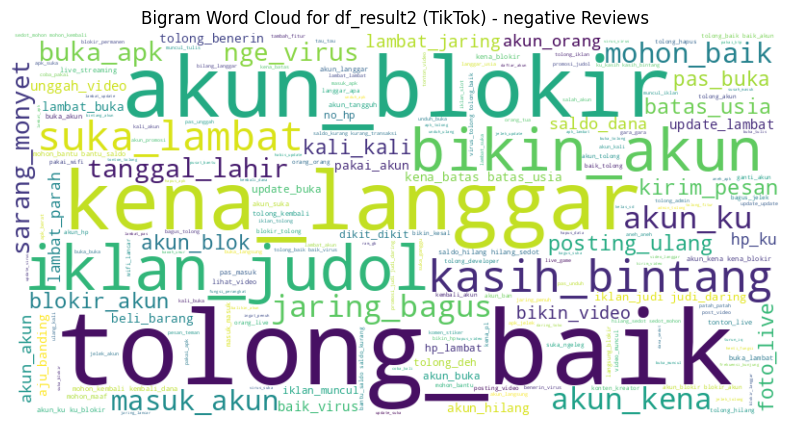

In [83]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.util import bigrams
import nltk

def generate_bigram_word_clouds(df, df_name):
    print(f"\n--- Generating Bigram Word Clouds for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating bigram word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Tokenize the combined text
            words_category = nltk.word_tokenize(all_processed_text_category)

            # Generate bigrams
            bigrams_list = list(bigrams(words_category))

            # Join bigrams into single strings for word cloud (e.g., 'word1_word2')
            bigrams_as_strings = ['_'.join(bigram) for bigram in bigrams_list]
            bigram_text = ' '.join(bigrams_as_strings)

            if bigram_text:
                # Generate word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate(bigram_text)

                # Display the generated image:
                plt.figure(figsize=(10, 5))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.title(f'Bigram Word Cloud for {df_name} - {category} Reviews')
                plt.axis('off')
                plt.show()
            else:
                print(f"No bigrams available to generate word cloud for {category} category in {df_name}.")
        else:
            print(f"No text available to generate bigram word cloud for {category} category in {df_name}.")

# Generate bigram word clouds for df_result1 (YouTube)
generate_bigram_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate bigram word clouds for df_result2 (TikTok)
generate_bigram_word_clouds(df_result2, 'df_result2 (TikTok)')

In [84]:
from nltk.probability import FreqDist
from nltk.util import trigrams
import nltk

def get_most_common_trigrams_by_category(df, df_name, num_trigrams=10):
    print(f"\n--- Most Common Trigrams for {df_name} by Score Category ---")
    for category in df['score_cat'].unique():
        if pd.isna(category):  # Skip NaN categories
            continue
        print(f"\nCategory: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate trigrams
        trigrams_category = list(trigrams(words_category))

        # Calculate trigram frequency
        fdist_trigrams = FreqDist(trigrams_category)

        # Get the most common trigrams
        most_common_trigrams = fdist_trigrams.most_common(num_trigrams)

        if most_common_trigrams:
            for trigram_pair, frequency in most_common_trigrams:
                print(f"  {' '.join(trigram_pair)}: {frequency}")
        else:
            print("  No trigrams found for this category.")

# Get most common trigrams for df_result1 by score_cat
get_most_common_trigrams_by_category(df_result1, 'df_result1 (YouTube)')

# Get most common trigrams for df_result2 by score_cat
get_most_common_trigrams_by_category(df_result2, 'df_result2 (TikTok)')


--- Most Common Trigrams for df_result1 (YouTube) by Score Category ---

Category: positive
  bantu cari informasi: 3
  bagus aplikasi bagus: 3
  tolong baik bagus: 3
  apologize punya mistake: 3
  buka bagus tonton: 2
  bagus tonton film: 2
  manfaat bantu cari: 2
  bagus bagus seru: 2
  suka tonton suka: 2
  suka mantap suka: 2

Category: neutral
  tolong baik virus: 9
  video bahasa inggris: 5
  fitur trek audio: 5
  jaring wifi bagus: 4
  tonton video short: 4
  iklan menit iklan: 4
  dikit dikit iklan: 4
  jaring bagus buka: 4
  bagus kasih bintang: 4
  sulih suara otomatis: 4

Category: negative
  fitur trek audio: 8
  trek audio otomatis: 6
  sulih suara otomatis: 6
  iklan menit iklan: 5
  iklan judi daring: 5
  judi daring pinjam: 5
  daring pinjam daring: 5
  tolong baik buka: 5
  tolong baik ganggu: 5
  update tolong baik: 5

--- Most Common Trigrams for df_result2 (TikTok) by Score Category ---

Category: positive
  bagus bagus suka: 5
  fitur posting ulang: 5
  bagus seru


--- Visualizing Most Common Trigrams for df_result1 (YouTube) by Score Category ---
Processing category: positive
Processing category: neutral


/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


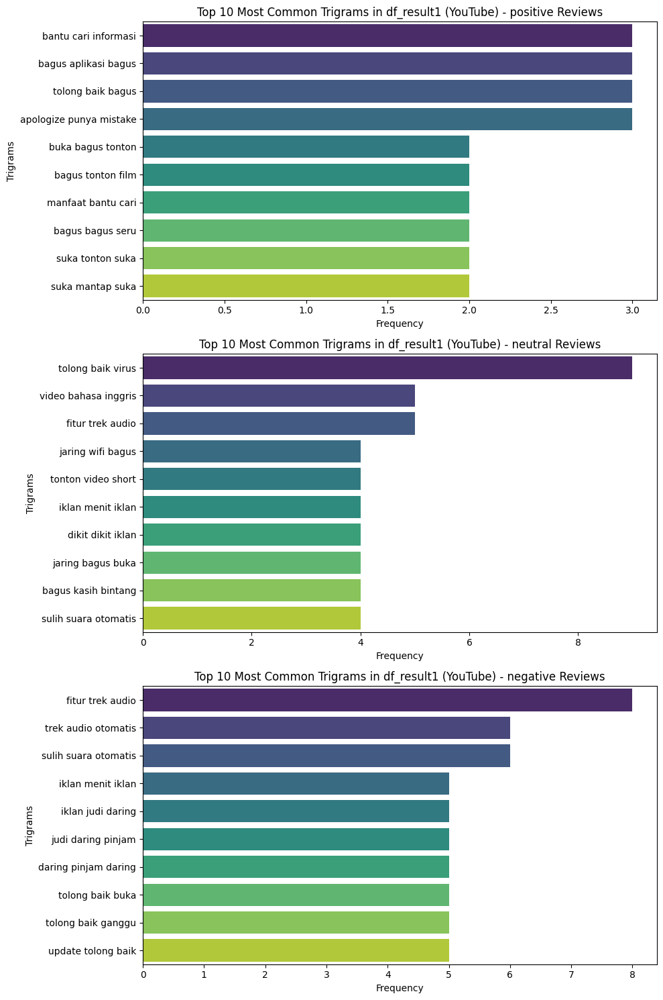


--- Visualizing Most Common Trigrams for df_result2 (TikTok) by Score Category ---
Processing category: positive
Processing category: neutral


/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-809375597.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


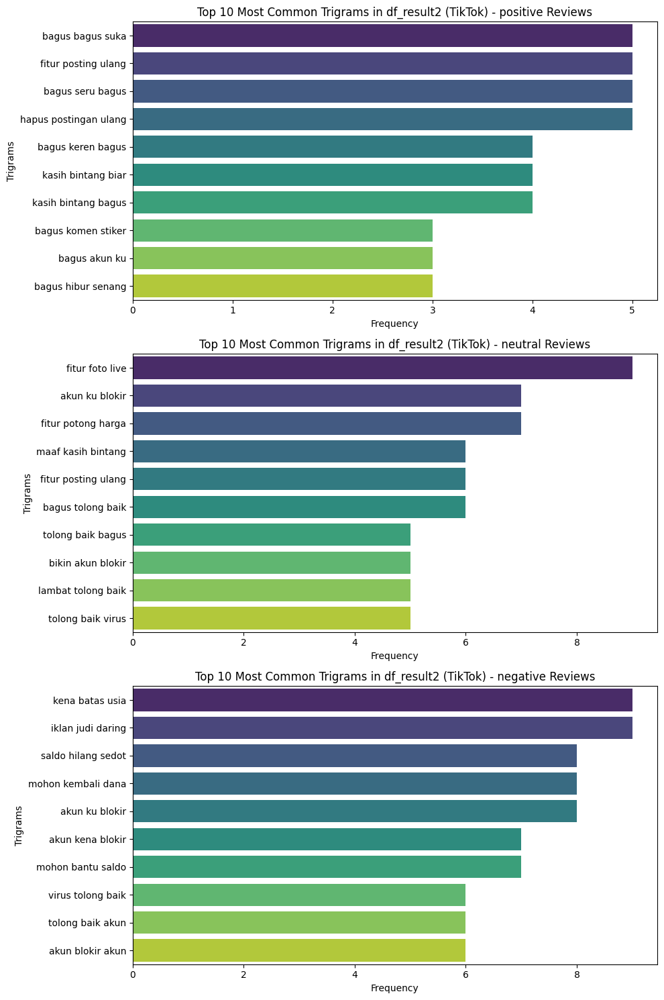

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
from nltk.util import trigrams
import nltk

def plot_most_common_trigrams(df, df_name, num_trigrams=10):
    print(f"\n--- Visualizing Most Common Trigrams for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate trigrams
        trigrams_category = list(trigrams(words_category))

        # Calculate trigram frequency
        fdist_trigrams = FreqDist(trigrams_category)

        # Get the most common trigrams
        most_common_trigrams = fdist_trigrams.most_common(num_trigrams)

        if most_common_trigrams:
            # Prepare data for plotting
            trigram_labels = [' '.join(trigram_pair) for trigram_pair, freq in most_common_trigrams]
            frequencies = [freq for trigram_pair, freq in most_common_trigrams]

            sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_trigrams} Most Common Trigrams in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Trigrams')
        else:
            ax.text(0.5, 0.5, 'No trigrams found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_trigrams} Most Common Trigrams in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common trigrams for df_result1 by score_cat
plot_most_common_trigrams(df_result1, 'df_result1 (YouTube)')

# Plot most common trigrams for df_result2 by score_cat
plot_most_common_trigrams(df_result2, 'df_result2 (TikTok)')


--- Generating Trigram Word Clouds for df_result1 (YouTube) by Score Category ---
Generating trigram word cloud for positive category in df_result1 (YouTube)...


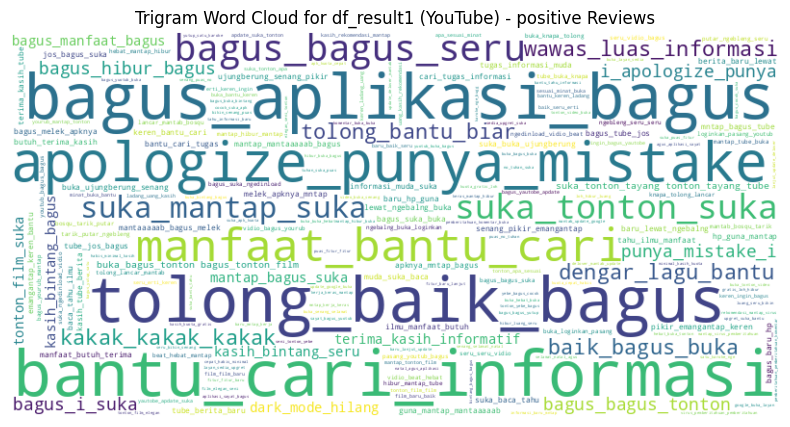

Generating trigram word cloud for neutral category in df_result1 (YouTube)...


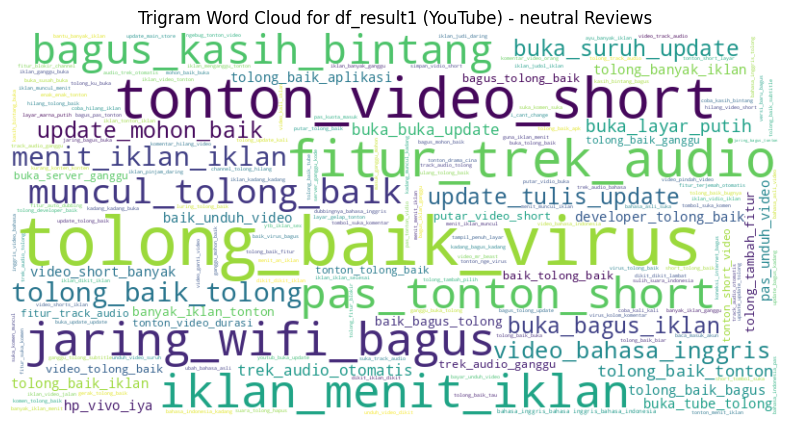

Generating trigram word cloud for negative category in df_result1 (YouTube)...


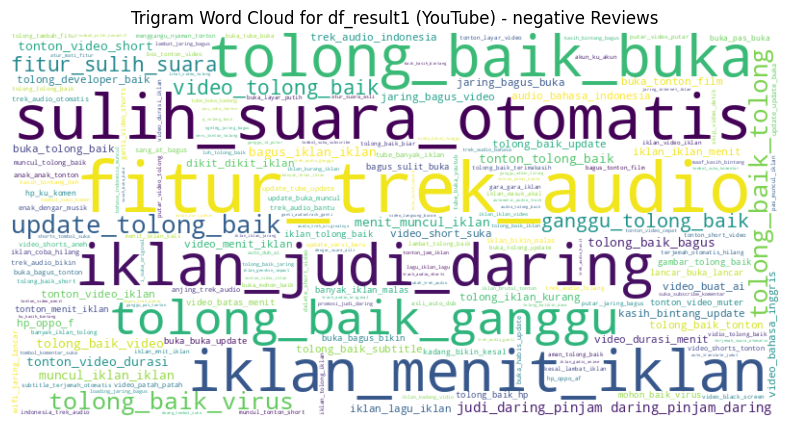


--- Generating Trigram Word Clouds for df_result2 (TikTok) by Score Category ---
Generating trigram word cloud for positive category in df_result2 (TikTok)...


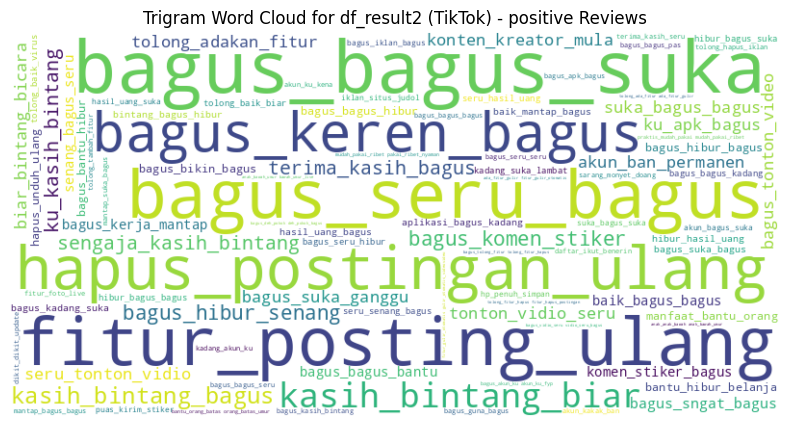

Generating trigram word cloud for neutral category in df_result2 (TikTok)...


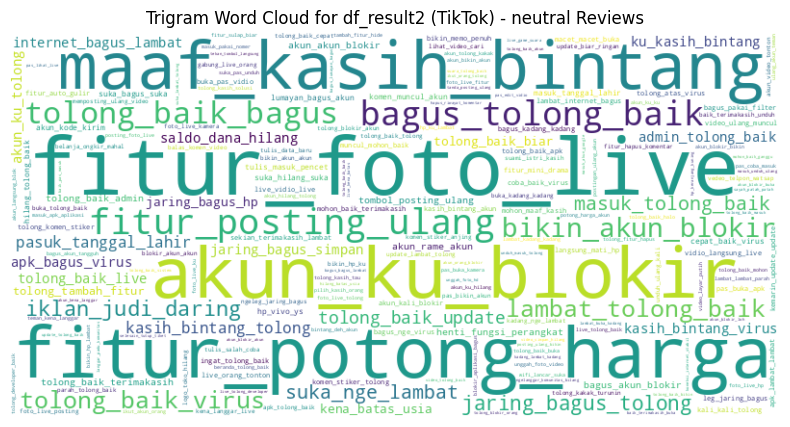

Generating trigram word cloud for negative category in df_result2 (TikTok)...


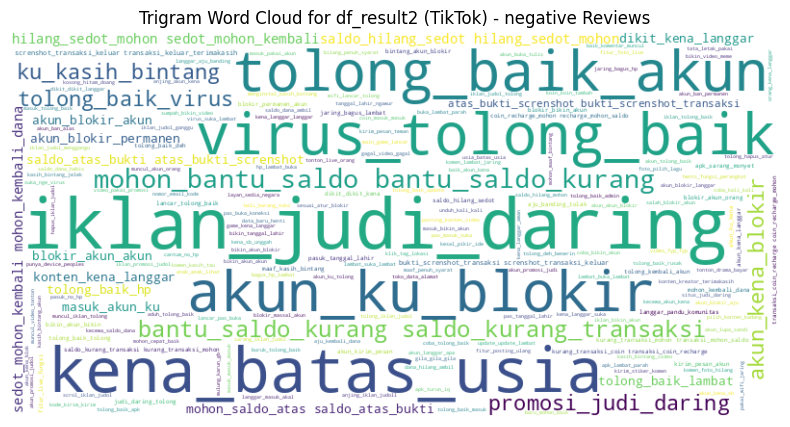

In [86]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.util import trigrams
import nltk

def generate_trigram_word_clouds(df, df_name):
    print(f"\n--- Generating Trigram Word Clouds for {df_name} by Score Category ---")
    categories = df['score_cat'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating trigram word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['score_cat'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Tokenize the combined text
            words_category = nltk.word_tokenize(all_processed_text_category)

            # Generate trigrams
            trigrams_list = list(trigrams(words_category))

            # Join trigrams into single strings for word cloud (e.g., 'word1_word2_word3')
            trigrams_as_strings = ['_'.join(trigram) for trigram in trigrams_list]
            trigram_text = ' '.join(trigrams_as_strings)

            if trigram_text:
                # Generate word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate(trigram_text)

                # Display the generated image:
                plt.figure(figsize=(10, 5))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.title(f'Trigram Word Cloud for {df_name} - {category} Reviews')
                plt.axis('off')
                plt.show()
            else:
                print(f"No trigrams available to generate word cloud for {category} category in {df_name}.")
        else:
            print(f"No text available to generate trigram word cloud for {category} category in {df_name}.")

# Generate trigram word clouds for df_result1 (YouTube)
generate_trigram_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate trigram word clouds for df_result2 (TikTok)
generate_trigram_word_clouds(df_result2, 'df_result2 (TikTok)')

In [87]:
df_result1.shape

(5252, 6)

In [88]:
df_result2.shape

(5873, 6)

LEXICON

In [89]:
positive_words = ['bagus', 'mantap', 'keren', 'hebat', 'baik', 'suka', 'senang', 'membantu', 'seru', 'cocok']
negative_words = ['jelek', 'rusak', 'buruk', 'bug', 'lambat', 'ganggu', 'error', 'masalah', 'tidak bisa', 'sulit', 'iklan', 'blokir']

print("Positive words lexicon created successfully.")
print("Negative words lexicon created successfully.")

Positive words lexicon created successfully.
Negative words lexicon created successfully.


In [90]:
def classify_sentiment(text):
    if not isinstance(text, str): # Handle non-string inputs, e.g., NaN
        return 'neutral'

    words = text.lower().split()
    positive_score = sum(1 for word in words if word in positive_words)
    negative_score = sum(1 for word in words if word in negative_words)

    if positive_score > negative_score:
        return 'positive'
    elif negative_score > positive_score:
        return 'negative'
    else:
        return 'neutral'

df_result1['lexicon_sentiment'] = df_result1['normal2'].apply(classify_sentiment)
df_result2['lexicon_sentiment'] = df_result2['normal2'].apply(classify_sentiment)

print("Sentiment classification applied to df_result1 and df_result2.")
print("Head of df_result1 with 'lexicon_sentiment' column:")
display(df_result1.head())
print("\nHead of df_result2 with 'lexicon_sentiment' column:")
display(df_result2.head())

Sentiment classification applied to df_result1 and df_result2.
Head of df_result1 with 'lexicon_sentiment' column:


/tmp/ipython-input-1464309317.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_result2['lexicon_sentiment'] = df_result2['normal2'].apply(classify_sentiment)


,content,score,score_cat,normal,processed,normal2,lexicon_sentiment
0,Nice,5,positive,Nice,,,neutral
1,YOuTube,5,positive,YOuTube,,,neutral
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus,bagus,positive
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp,baru hp,neutral
4,Oke,5,positive,Oke,,,neutral



Head of df_result2 with 'lexicon_sentiment' column:


,content,score,score_cat,normal,processed,normal2,lexicon_sentiment
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,mudah,mudah,neutral
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,senangaq bsh ajar nyayi konten terimakasih,senangaq bsh ajar nyayi konten terimakasih,neutral
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer saran hapus postingan sukaidi su...,hai developer saran hapus postingan sukaidi su...,positive
3,baguss,5,positive,bagus,bagus,bagus,positive
4,bagus,5,positive,bagus,bagus,bagus,positive


visual dari lexicon

In [91]:
def classify_sentiment(text):
    if not isinstance(text, str): # Handle non-string inputs, e.g., NaN
        return 'neutral'

    words = text.lower().split()
    positive_score = sum(1 for word in words if word in positive_words)
    negative_score = sum(1 for word in words if word in negative_words)

    if positive_score > negative_score:
        return 'positive'
    elif negative_score > positive_score:
        return 'negative'
    else:
        return 'neutral'

# Explicitly create copies to avoid SettingWithCopyWarning
df_result1 = df_result1.copy()
df_result2 = df_result2.copy()

df_result1['lexicon_sentiment'] = df_result1['normal2'].apply(classify_sentiment)
df_result2['lexicon_sentiment'] = df_result2['normal2'].apply(classify_sentiment)

print("Sentiment classification applied to df_result1 and df_result2.")
print("Head of df_result1 with 'lexicon_sentiment' column:")
display(df_result1.head())
print("\nHead of df_result2 with 'lexicon_sentiment' column:")
display(df_result2.head())

Sentiment classification applied to df_result1 and df_result2.
Head of df_result1 with 'lexicon_sentiment' column:


,content,score,score_cat,normal,processed,normal2,lexicon_sentiment
0,Nice,5,positive,Nice,,,neutral
1,YOuTube,5,positive,YOuTube,,,neutral
2,Sangat bagus skali,5,positive,Sangat bagus sekali,bagus,bagus,positive
3,saya memperbarui YouTube saya di hp baru,5,positive,aku memperbarui YouTube aku di hp baru,baru hp,baru hp,neutral
4,Oke,5,positive,Oke,,,neutral



Head of df_result2 with 'lexicon_sentiment' column:


,content,score,score_cat,normal,processed,normal2,lexicon_sentiment
0,Sangat mudah di gunakan,5,positive,Sangat mudah di gunakan,mudah,mudah,neutral
1,sangat mmbuat AQ senang.aq bsh blajar nyayi da...,5,positive,sangat buat AQ senang.aq bsh belajar nyayi dan...,senangaq bsh ajar nyayi konten terimakasih,senangaq bsh ajar nyayi konten terimakasih,neutral
2,hai developer saya hanya ingin memberi saran a...,5,positive,hai developer aku hanya ingin memberi saran ag...,hai developer saran hapus postingan sukaidi su...,hai developer saran hapus postingan sukaidi su...,positive
3,baguss,5,positive,bagus,bagus,bagus,positive
4,bagus,5,positive,bagus,bagus,bagus,positive


In [92]:
print("Value Counts for df_result1 (score_cat vs. lexicon_sentiment):")
display(df_result1[['score_cat', 'lexicon_sentiment']].value_counts().sort_index())

print("\nValue Counts for df_result2 (score_cat vs. lexicon_sentiment):")
display(df_result2[['score_cat', 'lexicon_sentiment']].value_counts().sort_index())

Value Counts for df_result1 (score_cat vs. lexicon_sentiment):


score_cat  lexicon_sentiment
negative   negative              414
           neutral              1334
           positive              292
neutral    negative              293
           neutral              1144
           positive              433
positive   negative               42
           neutral               836
           positive              464
Name: count, dtype: int64


Value Counts for df_result2 (score_cat vs. lexicon_sentiment):


score_cat  lexicon_sentiment
negative   negative              479
           neutral              1391
           positive              272
neutral    negative              287
           neutral              1330
           positive              503
positive   negative               48
           neutral               743
           positive              820
Name: count, dtype: int64

Visualizing Lexicon Sentiment for df_result1 (YouTube):


/tmp/ipython-input-746297692.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='lexicon_sentiment', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])


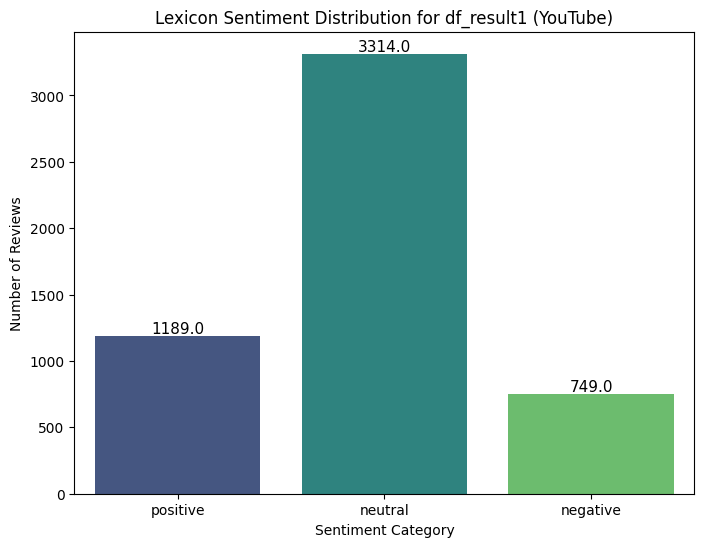


Visualizing Lexicon Sentiment for df_result2 (TikTok):


/tmp/ipython-input-746297692.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='lexicon_sentiment', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])


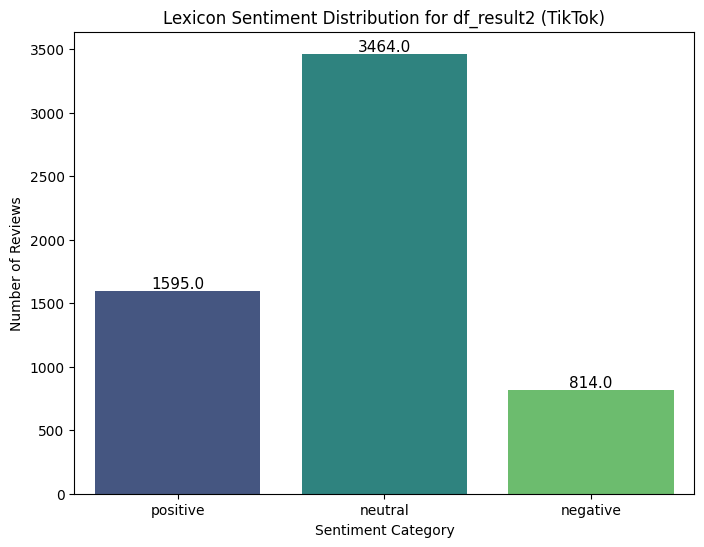

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_lexicon_sentiment_counts(df, df_name):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x='lexicon_sentiment', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])
    plt.title(f'Lexicon Sentiment Distribution for {df_name}')
    plt.xlabel('Sentiment Category')
    plt.ylabel('Number of Reviews')

    # Add counts on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.show()

print("Visualizing Lexicon Sentiment for df_result1 (YouTube):")
plot_lexicon_sentiment_counts(df_result1, 'df_result1 (YouTube)')

print("\nVisualizing Lexicon Sentiment for df_result2 (TikTok):")
plot_lexicon_sentiment_counts(df_result2, 'df_result2 (TikTok)')

Visualizing Original Score Categories for df_result1 (YouTube):


/tmp/ipython-input-3806659523.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='score_cat', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])


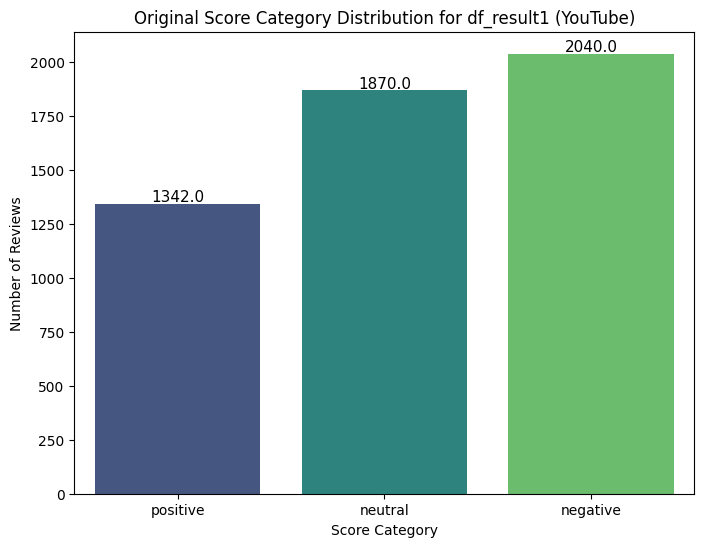

/tmp/ipython-input-3806659523.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='score_cat', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])



Visualizing Original Score Categories for df_result2 (TikTok):


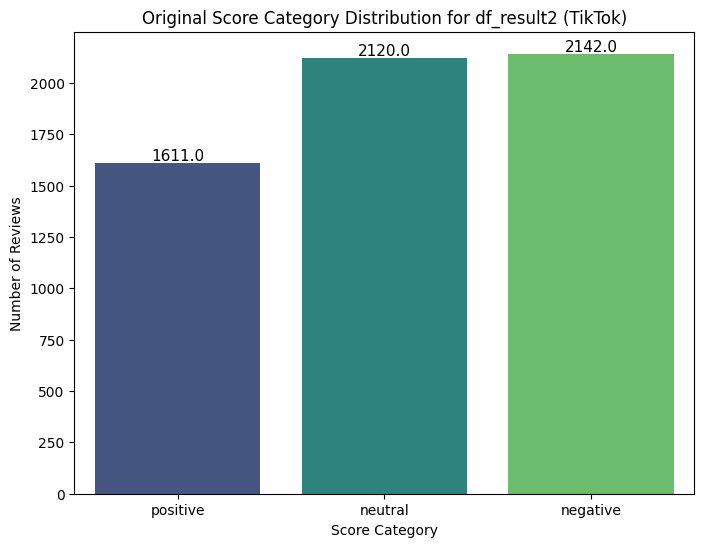

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_score_category_counts(df, df_name):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x='score_cat', data=df, palette='viridis', order=['positive', 'neutral', 'negative'])
    plt.title(f'Original Score Category Distribution for {df_name}')
    plt.xlabel('Score Category')
    plt.ylabel('Number of Reviews')

    # Add counts on top of the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.show()

print("Visualizing Original Score Categories for df_result1 (YouTube):")
plot_score_category_counts(df_result1, 'df_result1 (YouTube)')

print("\nVisualizing Original Score Categories for df_result2 (TikTok):")
plot_score_category_counts(df_result2, 'df_result2 (TikTok)')

In [93]:
from nltk.probability import FreqDist
import nltk

def get_most_common_words_by_category(df, df_name, num_words=10):
    print(f"\n--- Most Common Words for {df_name} by Score Category ---")
    for category in df['lexicon_sentiment'].unique():
        if pd.isna(category): # Skip NaN categories if any remain
            continue
        print(f"\nCategory: {category}")
        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Calculate word frequency
        fdist_category = FreqDist(words_category)

        # Get the most common words
        most_common_words = fdist_category.most_common(num_words)

        if most_common_words:
            for word, frequency in most_common_words:
                print(f"  {word}: {frequency}")
        else:
            print("  No words found for this category.")

# Get most common words for df_result1 by score_cat
get_most_common_words_by_category(df_result1, 'df_result1')

# Get most common words for df_result2 by score_cat
get_most_common_words_by_category(df_result2, 'df_result2')


--- Most Common Words for df_result1 by Score Category ---

Category: neutral
  buka: 556
  video: 316
  update: 275
  tolong: 262
  tonton: 207
  hp: 124
  unduh: 109
  masuk: 107
  virus: 106
  tube: 105

Category: positive
  bagus: 590
  suka: 313
  baik: 281
  tolong: 231
  video: 216
  tonton: 187
  seru: 92
  virus: 80
  buka: 77
  update: 69

Category: negative
  iklan: 784
  ganggu: 243
  video: 200
  tonton: 170
  tolong: 117
  menit: 80
  muncul: 78
  lambat: 70
  update: 59
  banyak: 57

--- Most Common Words for df_result2 by Score Category ---

Category: neutral
  akun: 438
  tolong: 342
  live: 288
  buka: 235
  update: 205
  video: 198
  fitur: 177
  masuk: 159
  hilang: 155
  apk: 150

Category: positive
  bagus: 836
  suka: 417
  baik: 356
  tolong: 311
  seru: 185
  akun: 160
  video: 120
  virus: 118
  apk: 98
  tonton: 92

Category: negative
  lambat: 312
  akun: 256
  blokir: 246
  iklan: 206
  tolong: 125
  jelek: 106
  ganggu: 101
  buka: 93
  bikin: 73
  update


--- Visualizing Most Common Words for df_result1 (YouTube) by Score Category ---
Processing category: neutral
Processing category: positive


/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


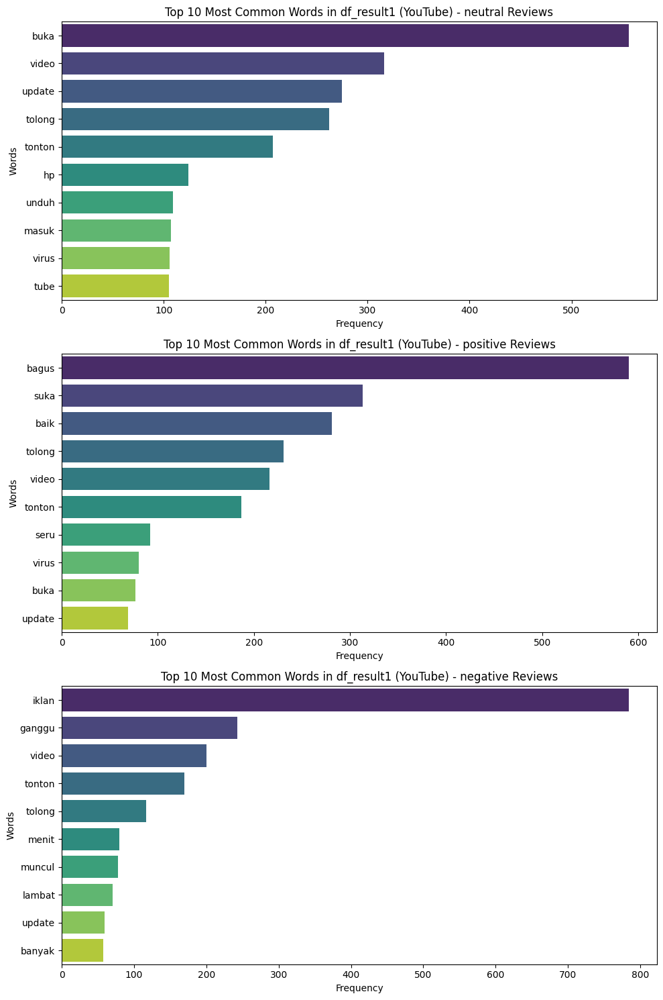


--- Visualizing Most Common Words for df_result2 (TikTok) by Score Category ---
Processing category: neutral
Processing category: positive


/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-349510071.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')


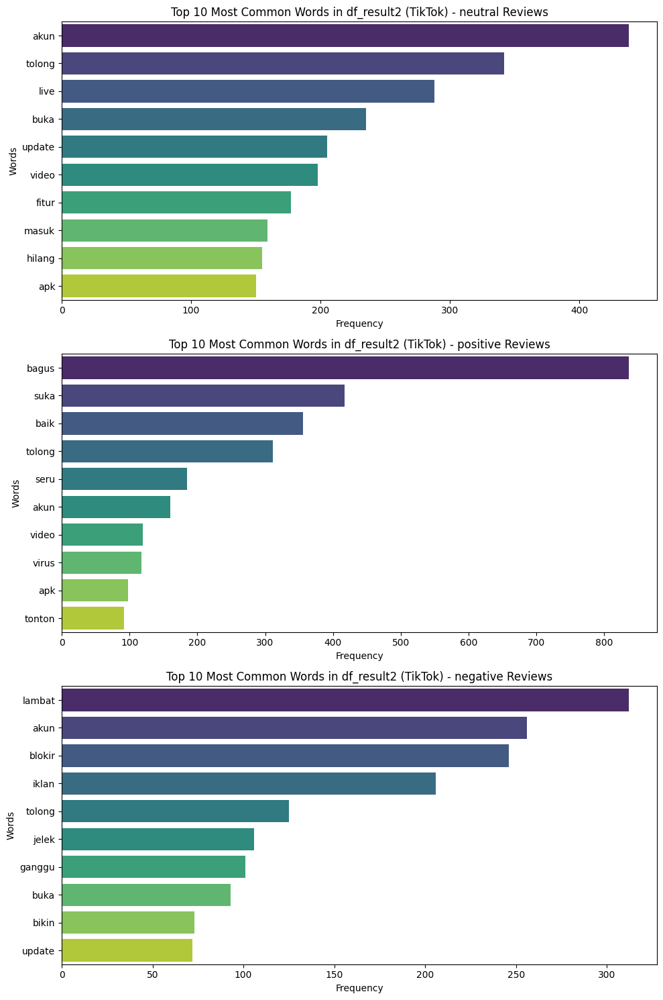

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
import nltk

def plot_most_common_words(df, df_name, num_words=10):
    print(f"\n--- Visualizing Most Common Words for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Calculate word frequency
        fdist_category = FreqDist(words_category)

        # Get the most common words
        most_common_words = fdist_category.most_common(num_words)

        if most_common_words:
            words = [word for word, freq in most_common_words]
            frequencies = [freq for word, freq in most_common_words]

            sns.barplot(x=frequencies, y=words, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_words} Most Common Words in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Words')
        else:
            ax.text(0.5, 0.5, 'No words found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_words} Most Common Words in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common words for df_result1 by score_cat
plot_most_common_words(df_result1, 'df_result1 (YouTube)')

# Plot most common words for df_result2 by score_cat
plot_most_common_words(df_result2, 'df_result2 (TikTok)')


--- Generating Word Clouds for df_result1 (YouTube) by Score Category ---
Generating word cloud for neutral category in df_result1 (YouTube)...


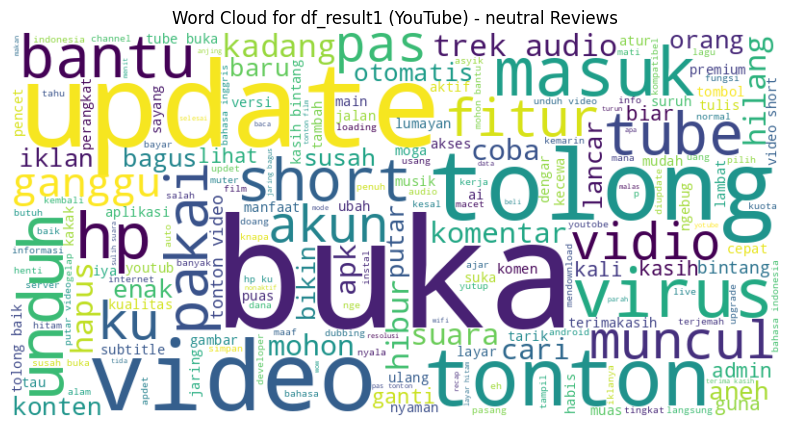

Generating word cloud for positive category in df_result1 (YouTube)...


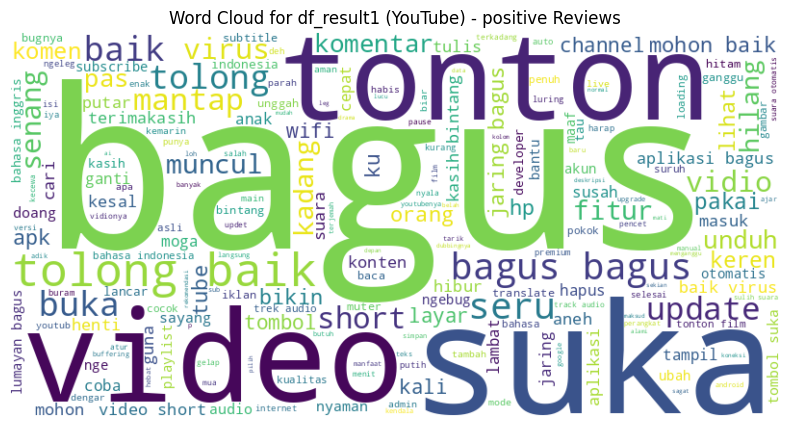

Generating word cloud for negative category in df_result1 (YouTube)...


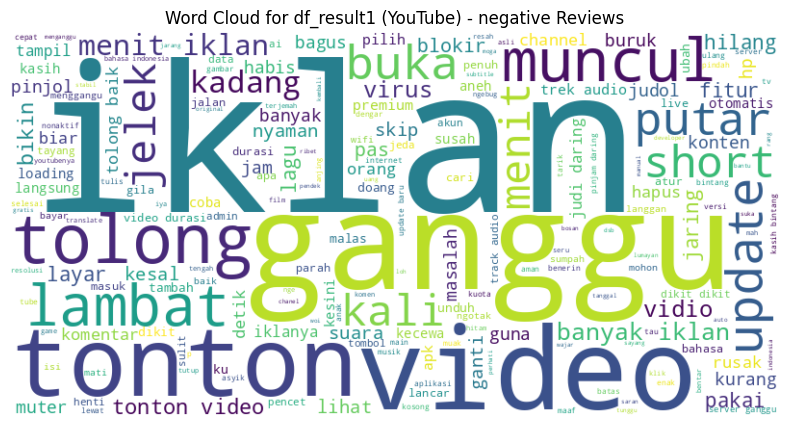


--- Generating Word Clouds for df_result2 (TikTok) by Score Category ---
Generating word cloud for neutral category in df_result2 (TikTok)...


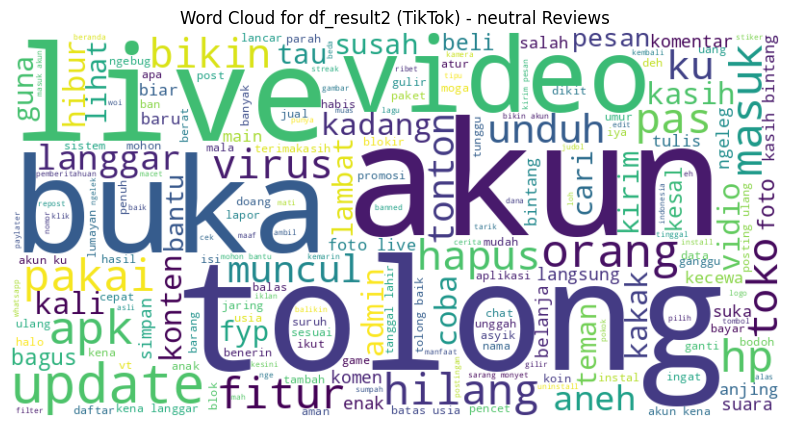

Generating word cloud for positive category in df_result2 (TikTok)...


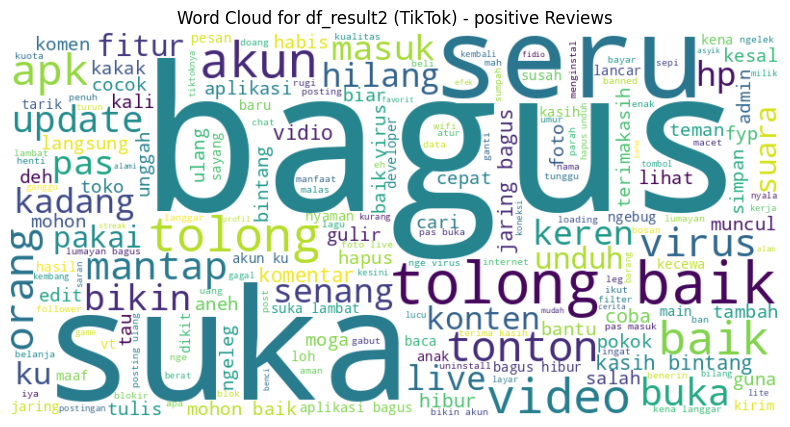

Generating word cloud for negative category in df_result2 (TikTok)...


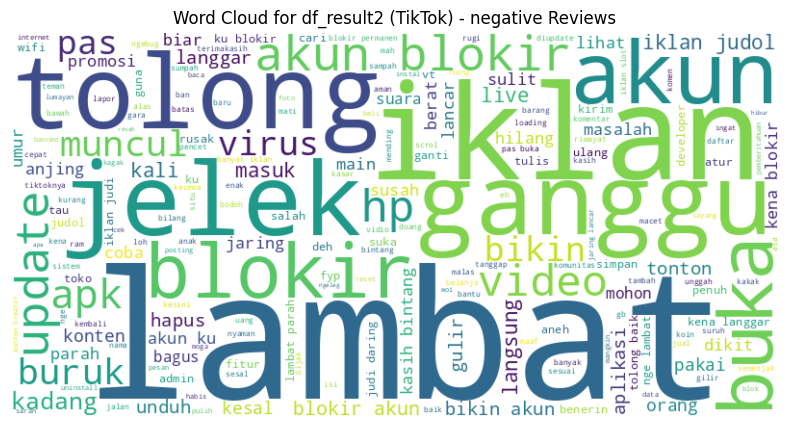

In [95]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_word_clouds(df, df_name):
    print(f"\n--- Generating Word Clouds for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Generate word cloud
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_processed_text_category)

            # Display the generated image:
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'Word Cloud for {df_name} - {category} Reviews')
            plt.axis('off')
            plt.show()
        else:
            print(f"No text available to generate word cloud for {category} category in {df_name}.")

# Generate word clouds for df_result1 (YouTube)
generate_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate word clouds for df_result2 (TikTok)
generate_word_clouds(df_result2, 'df_result2 (TikTok)')

In [96]:
from nltk.probability import FreqDist
from nltk.util import bigrams
import nltk

def get_most_common_bigrams_by_category(df, df_name, num_bigrams=10):
    print(f"\n--- Most Common Bigrams for {df_name} by Score Category ---")
    for category in df['lexicon_sentiment'].unique():
        if pd.isna(category):  # Skip NaN categories
            continue
        print(f"\nCategory: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate bigrams
        bigrams_category = list(bigrams(words_category))

        # Calculate bigram frequency
        fdist_bigrams = FreqDist(bigrams_category)

        # Get the most common bigrams
        most_common_bigrams = fdist_bigrams.most_common(num_bigrams)

        if most_common_bigrams:
            for bigram_pair, frequency in most_common_bigrams:
                print(f"  {' '.join(bigram_pair)}: {frequency}")
        else:
            print("  No bigrams found for this category.")

# Get most common bigrams for df_result1 by score_cat
get_most_common_bigrams_by_category(df_result1, 'df_result1 (YouTube)')

# Get most common bigrams for df_result2 by score_cat
get_most_common_bigrams_by_category(df_result2, 'df_result2 (TikTok)')


--- Most Common Bigrams for df_result1 (YouTube) by Score Category ---

Category: neutral
  trek audio: 48
  buka buka: 37
  tonton video: 30
  tube buka: 26
  kasih bintang: 26
  tolong baik: 26
  buka tolong: 24
  buka update: 23
  update buka: 20
  buka tube: 19

Category: positive
  tolong baik: 153
  bagus bagus: 92
  baik bagus: 45
  bagus suka: 34
  mohon baik: 30
  jaring bagus: 29
  bagus tonton: 23
  aplikasi bagus: 23
  tonton video: 22
  bagus seru: 21

Category: negative
  iklan iklan: 64
  menit iklan: 40
  banyak iklan: 40
  tonton video: 32
  muncul iklan: 28
  iklan ganggu: 27
  iklan muncul: 23
  iklan video: 23
  iklan tonton: 22
  tonton iklan: 22

--- Most Common Bigrams for df_result2 (TikTok) by Score Category ---

Category: neutral
  foto live: 42
  kasih bintang: 40
  kena langgar: 40
  posting ulang: 34
  akun ku: 34
  batas usia: 32
  tolong baik: 27
  tanggal lahir: 25
  akun kena: 23
  masuk akun: 21

Category: positive
  tolong baik: 185
  bagus bagus: 10


--- Visualizing Most Common Bigrams for df_result1 (YouTube) by Score Category ---
Processing category: neutral
Processing category: positive


/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


Processing category: negative


/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


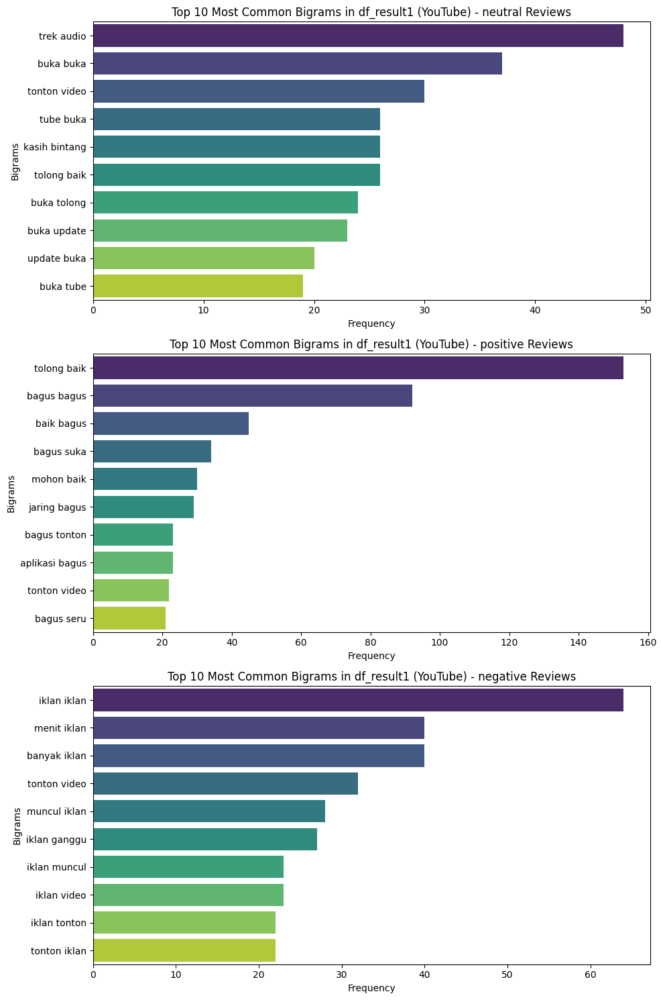


--- Visualizing Most Common Bigrams for df_result2 (TikTok) by Score Category ---
Processing category: neutral


/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


Processing category: positive
Processing category: negative


/tmp/ipython-input-2408844466.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')


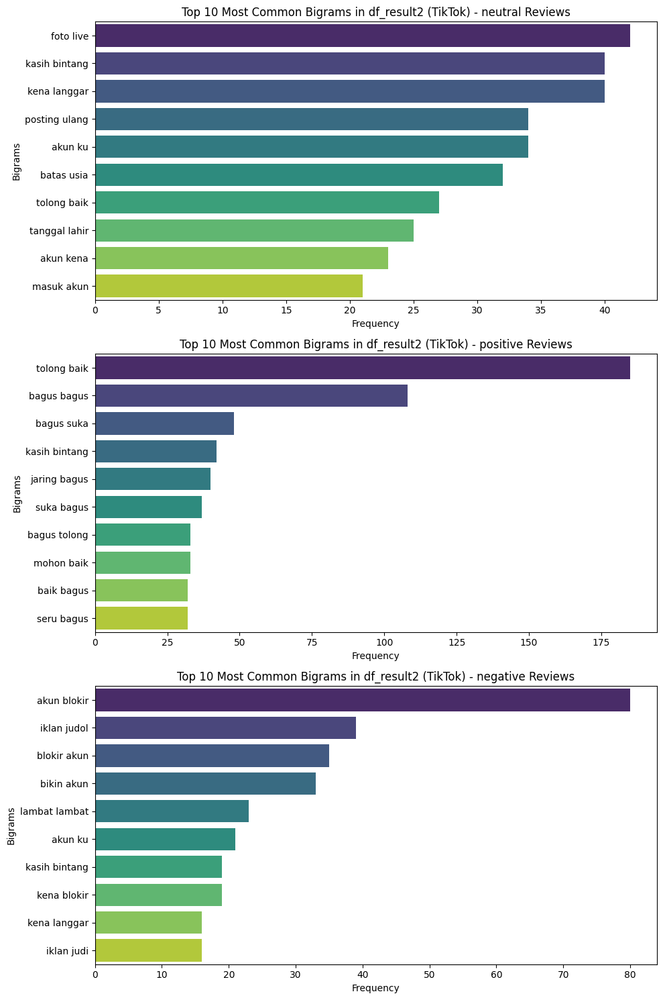

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
from nltk.util import bigrams
import nltk

def plot_most_common_bigrams(df, df_name, num_bigrams=10):
    print(f"\n--- Visualizing Most Common Bigrams for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate bigrams
        bigrams_category = list(bigrams(words_category))

        # Calculate bigram frequency
        fdist_bigrams = FreqDist(bigrams_category)

        # Get the most common bigrams
        most_common_bigrams = fdist_bigrams.most_common(num_bigrams)

        if most_common_bigrams:
            # Prepare data for plotting
            bigram_labels = [' '.join(bigram_pair) for bigram_pair, freq in most_common_bigrams]
            frequencies = [freq for bigram_pair, freq in most_common_bigrams]

            sns.barplot(x=frequencies, y=bigram_labels, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_bigrams} Most Common Bigrams in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Bigrams')
        else:
            ax.text(0.5, 0.5, 'No bigrams found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_bigrams} Most Common Bigrams in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common bigrams for df_result1 by score_cat
plot_most_common_bigrams(df_result1, 'df_result1 (YouTube)')

# Plot most common bigrams for df_result2 by score_cat
plot_most_common_bigrams(df_result2, 'df_result2 (TikTok)')


--- Generating Bigram Word Clouds for df_result1 (YouTube) by Score Category ---
Generating bigram word cloud for neutral category in df_result1 (YouTube)...


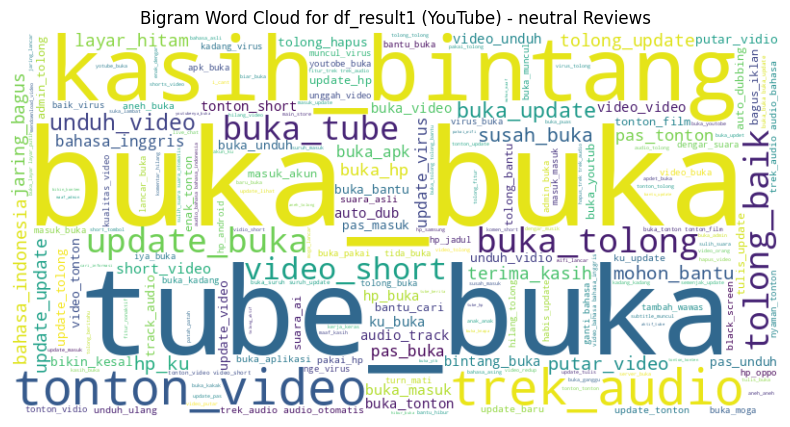

Generating bigram word cloud for positive category in df_result1 (YouTube)...


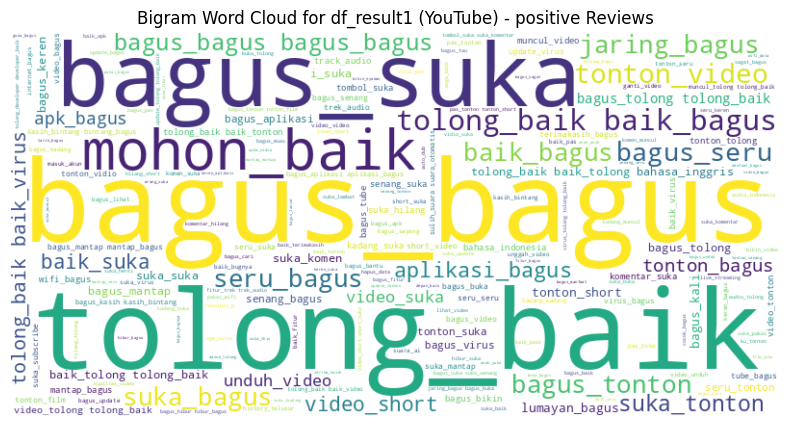

Generating bigram word cloud for negative category in df_result1 (YouTube)...


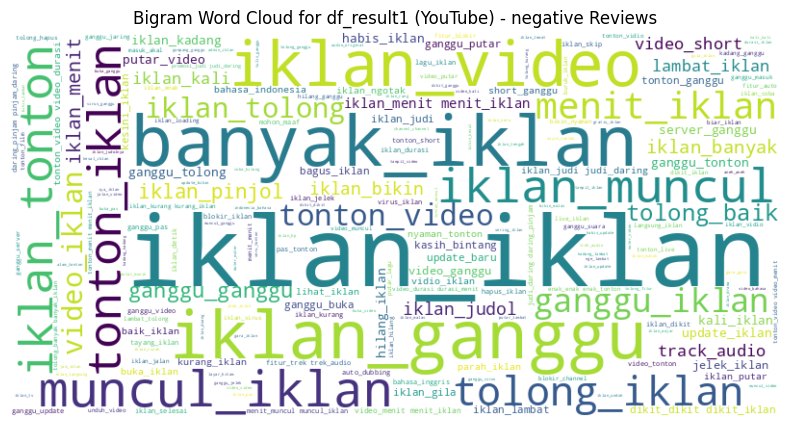


--- Generating Bigram Word Clouds for df_result2 (TikTok) by Score Category ---
Generating bigram word cloud for neutral category in df_result2 (TikTok)...


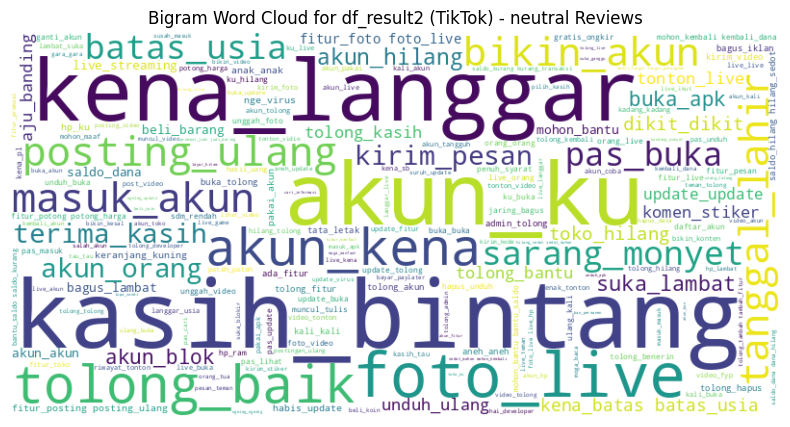

Generating bigram word cloud for positive category in df_result2 (TikTok)...


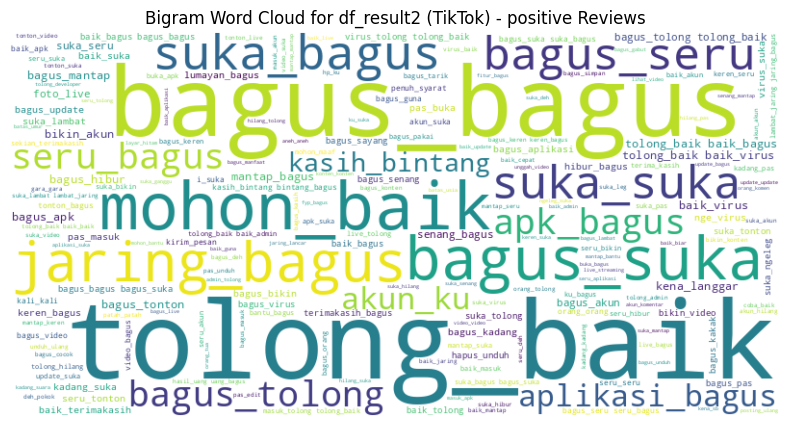

Generating bigram word cloud for negative category in df_result2 (TikTok)...


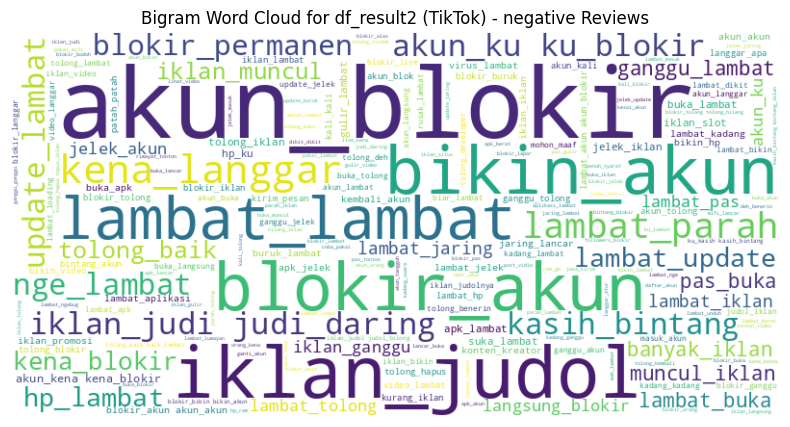

In [98]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.util import bigrams
import nltk

def generate_bigram_word_clouds(df, df_name):
    print(f"\n--- Generating Bigram Word Clouds for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating bigram word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Tokenize the combined text
            words_category = nltk.word_tokenize(all_processed_text_category)

            # Generate bigrams
            bigrams_list = list(bigrams(words_category))

            # Join bigrams into single strings for word cloud (e.g., 'word1_word2')
            bigrams_as_strings = ['_'.join(bigram) for bigram in bigrams_list]
            bigram_text = ' '.join(bigrams_as_strings)

            if bigram_text:
                # Generate word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate(bigram_text)

                # Display the generated image:
                plt.figure(figsize=(10, 5))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.title(f'Bigram Word Cloud for {df_name} - {category} Reviews')
                plt.axis('off')
                plt.show()
            else:
                print(f"No bigrams available to generate word cloud for {category} category in {df_name}.")
        else:
            print(f"No text available to generate bigram word cloud for {category} category in {df_name}.")

# Generate bigram word clouds for df_result1 (YouTube)
generate_bigram_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate bigram word clouds for df_result2 (TikTok)
generate_bigram_word_clouds(df_result2, 'df_result2 (TikTok)')

In [99]:
from nltk.probability import FreqDist
from nltk.util import trigrams
import nltk

def get_most_common_trigrams_by_category(df, df_name, num_trigrams=10):
    print(f"\n--- Most Common Trigrams for {df_name} by Score Category ---")
    for category in df['lexicon_sentiment'].unique():
        if pd.isna(category):  # Skip NaN categories
            continue
        print(f"\nCategory: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate trigrams
        trigrams_category = list(trigrams(words_category))

        # Calculate trigram frequency
        fdist_trigrams = FreqDist(trigrams_category)

        # Get the most common trigrams
        most_common_trigrams = fdist_trigrams.most_common(num_trigrams)

        if most_common_trigrams:
            for trigram_pair, frequency in most_common_trigrams:
                print(f"  {' '.join(trigram_pair)}: {frequency}")
        else:
            print("  No trigrams found for this category.")

# Get most common trigrams for df_result1 by score_cat
get_most_common_trigrams_by_category(df_result1, 'df_result1 (YouTube)')

# Get most common trigrams for df_result2 by score_cat
get_most_common_trigrams_by_category(df_result2, 'df_result2 (TikTok)')


--- Most Common Trigrams for df_result1 (YouTube) by Score Category ---

Category: neutral
  trek audio otomatis: 6
  trek audio bahasa: 6
  buka suruh update: 5
  buka tonton film: 5
  video bahasa inggris: 5
  buka buka update: 5
  buka layar putih: 4
  fitur trek audio: 4
  buka tolong bantu: 4
  hapus trek audio: 4

Category: positive
  tolong baik bagus: 26
  bagus bagus bagus: 19
  tolong baik virus: 14
  bagus tolong baik: 11
  baik tolong baik: 9
  tolong baik tolong: 9
  video tolong baik: 8
  bagus bagus suka: 7
  baik bagus bagus: 7
  tolong baik tonton: 7

Category: negative
  iklan menit iklan: 10
  dikit dikit iklan: 7
  iklan judi daring: 6
  tonton video durasi: 6
  menit iklan iklan: 6
  video menit iklan: 6
  iklan iklan iklan: 5
  menit muncul iklan: 5
  fitur trek audio: 5
  muncul iklan iklan: 5

--- Most Common Trigrams for df_result2 (TikTok) by Score Category ---

Category: neutral
  kena batas usia: 12
  fitur foto live: 11
  fitur posting ulang: 10
  saldo hi


--- Visualizing Most Common Trigrams for df_result1 (YouTube) by Score Category ---
Processing category: neutral


/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


Processing category: positive


/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


Processing category: negative


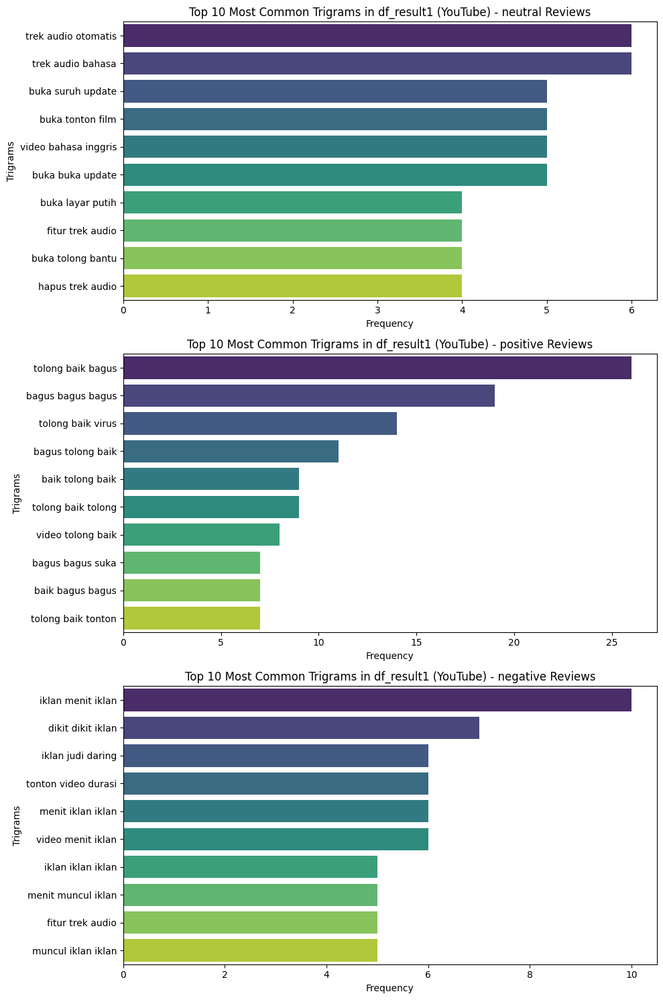


--- Visualizing Most Common Trigrams for df_result2 (TikTok) by Score Category ---
Processing category: neutral
Processing category: positive


/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
/tmp/ipython-input-1272510737.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')


Processing category: negative


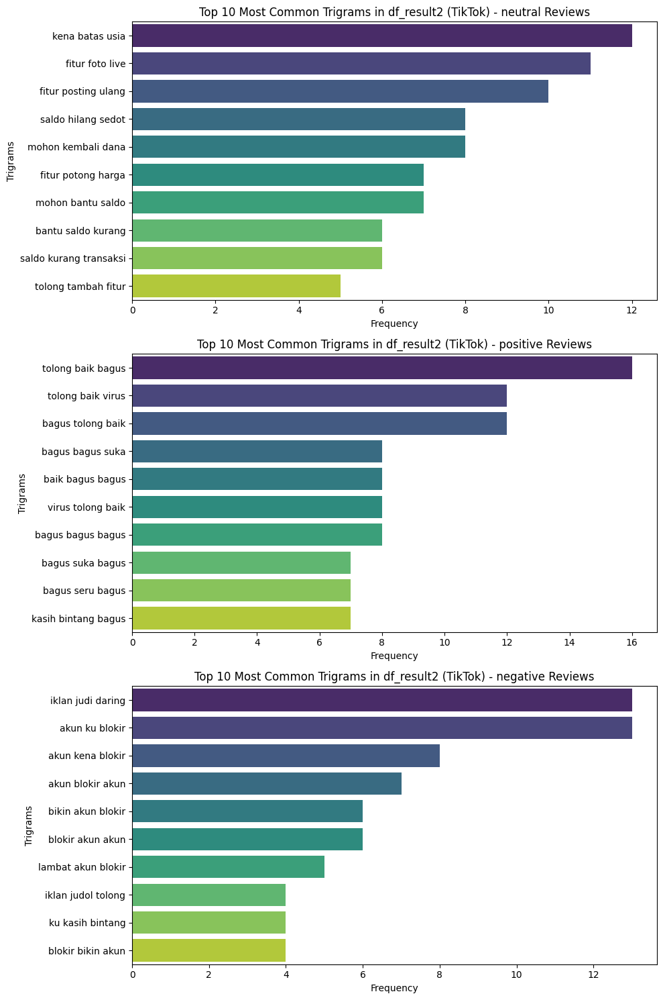

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.probability import FreqDist
from nltk.util import trigrams
import nltk

def plot_most_common_trigrams(df, df_name, num_trigrams=10):
    print(f"\n--- Visualizing Most Common Trigrams for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)] # Filter out NaN categories

    # Determine number of rows and columns for subplots
    num_categories = len(categories)
    if num_categories == 0:
        print(f"No valid categories to plot for {df_name}.")
        return

    n_cols = 1  # For simplicity, arrange plots in a single column
    n_rows = num_categories
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows))

    # Ensure axes is always an array for consistent indexing
    if n_rows == 1:
        axes = [axes]

    for i, category in enumerate(categories):
        ax = axes[i]
        print(f"Processing category: {category}")

        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        # Tokenize the combined text
        words_category = nltk.word_tokenize(all_processed_text_category)

        # Generate trigrams
        trigrams_category = list(trigrams(words_category))

        # Calculate trigram frequency
        fdist_trigrams = FreqDist(trigrams_category)

        # Get the most common trigrams
        most_common_trigrams = fdist_trigrams.most_common(num_trigrams)

        if most_common_trigrams:
            # Prepare data for plotting
            trigram_labels = [' '.join(trigram_pair) for trigram_pair, freq in most_common_trigrams]
            frequencies = [freq for trigram_pair, freq in most_common_trigrams]

            sns.barplot(x=frequencies, y=trigram_labels, ax=ax, palette='viridis')
            ax.set_title(f'Top {num_trigrams} Most Common Trigrams in {df_name} - {category} Reviews')
            ax.set_xlabel('Frequency')
            ax.set_ylabel('Trigrams')
        else:
            ax.text(0.5, 0.5, 'No trigrams found for this category.', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.set_title(f'Top {num_trigrams} Most Common Trigrams in {df_name} - {category} Reviews')

    plt.tight_layout()
    plt.show()

# Plot most common trigrams for df_result1 by score_cat
plot_most_common_trigrams(df_result1, 'df_result1 (YouTube)')

# Plot most common trigrams for df_result2 by score_cat
plot_most_common_trigrams(df_result2, 'df_result2 (TikTok)')


--- Generating Trigram Word Clouds for df_result1 (YouTube) by Score Category ---
Generating trigram word cloud for neutral category in df_result1 (YouTube)...


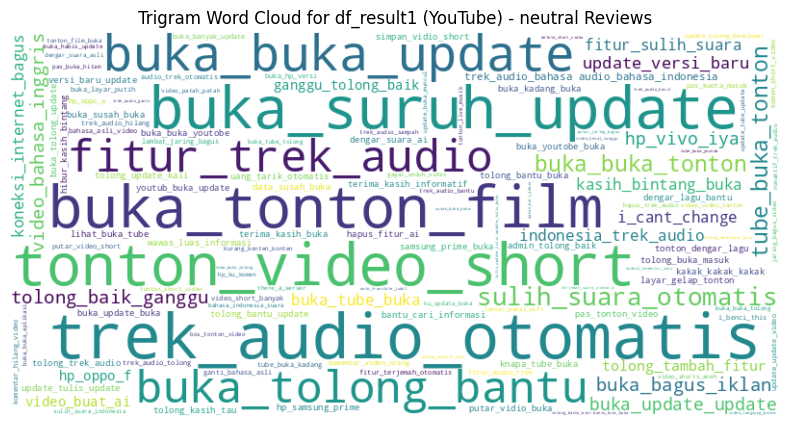

Generating trigram word cloud for positive category in df_result1 (YouTube)...


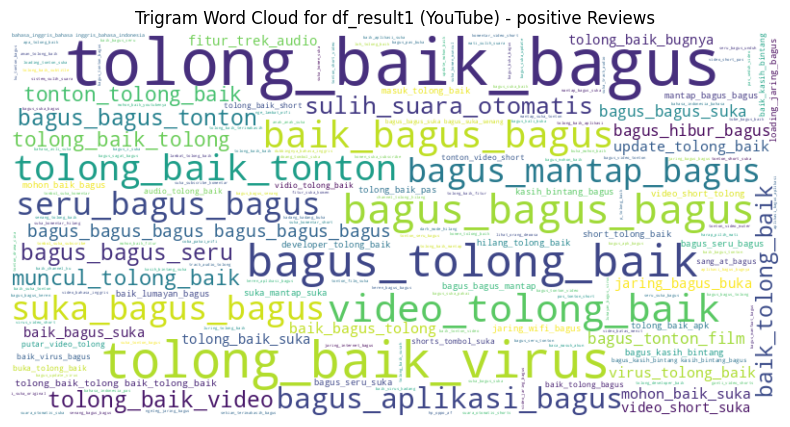

Generating trigram word cloud for negative category in df_result1 (YouTube)...


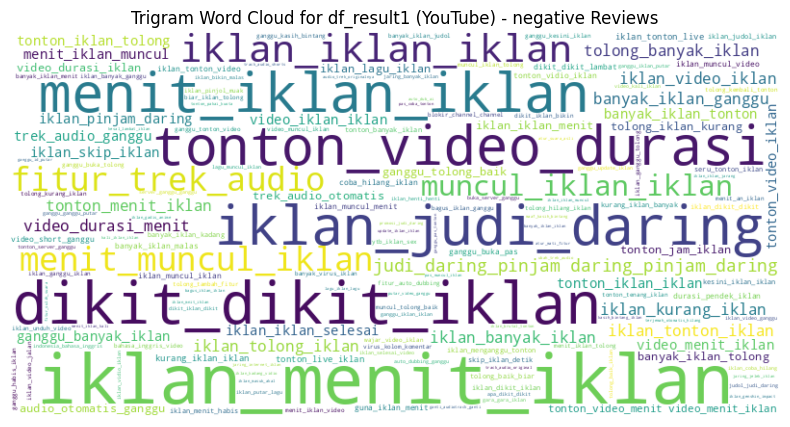


--- Generating Trigram Word Clouds for df_result2 (TikTok) by Score Category ---
Generating trigram word cloud for neutral category in df_result2 (TikTok)...


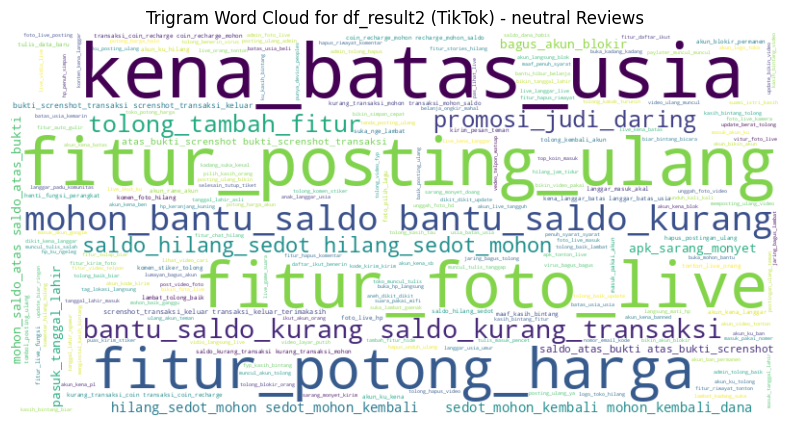

Generating trigram word cloud for positive category in df_result2 (TikTok)...


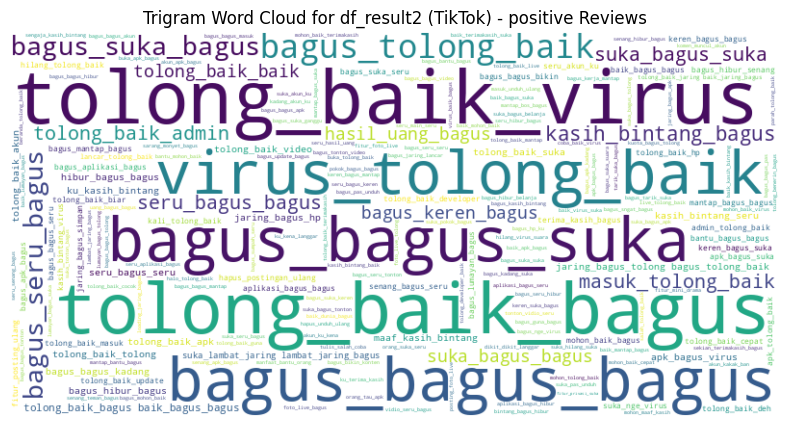

Generating trigram word cloud for negative category in df_result2 (TikTok)...


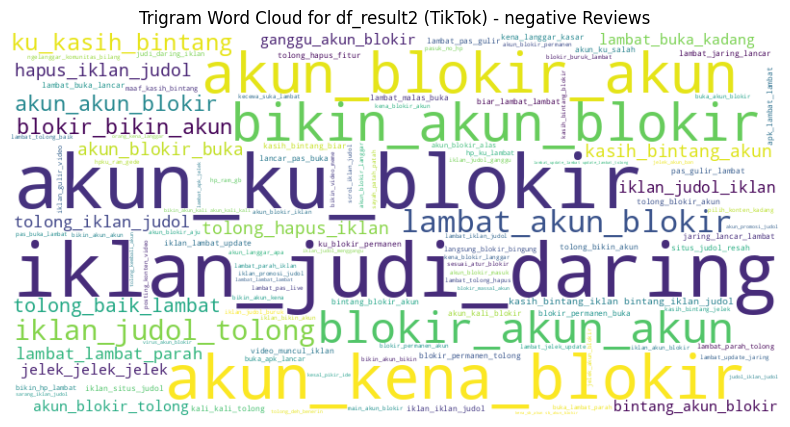

In [101]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.util import trigrams
import nltk

def generate_trigram_word_clouds(df, df_name):
    print(f"\n--- Generating Trigram Word Clouds for {df_name} by Score Category ---")
    categories = df['lexicon_sentiment'].unique()
    categories = [cat for cat in categories if pd.notna(cat)]

    for category in categories:
        print(f"Generating trigram word cloud for {category} category in {df_name}...")
        # Filter DataFrame by category
        filtered_df = df[df['lexicon_sentiment'] == category]

        # Combine all processed text for this category
        all_processed_text_category = ' '.join(filtered_df['normal2'])

        if all_processed_text_category:
            # Tokenize the combined text
            words_category = nltk.word_tokenize(all_processed_text_category)

            # Generate trigrams
            trigrams_list = list(trigrams(words_category))

            # Join trigrams into single strings for word cloud (e.g., 'word1_word2_word3')
            trigrams_as_strings = ['_'.join(trigram) for trigram in trigrams_list]
            trigram_text = ' '.join(trigrams_as_strings)

            if trigram_text:
                # Generate word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate(trigram_text)

                # Display the generated image:
                plt.figure(figsize=(10, 5))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.title(f'Trigram Word Cloud for {df_name} - {category} Reviews')
                plt.axis('off')
                plt.show()
            else:
                print(f"No trigrams available to generate word cloud for {category} category in {df_name}.")
        else:
            print(f"No text available to generate trigram word cloud for {category} category in {df_name}.")

# Generate trigram word clouds for df_result1 (YouTube)
generate_trigram_word_clouds(df_result1, 'df_result1 (YouTube)')

# Generate trigram word clouds for df_result2 (TikTok)
generate_trigram_word_clouds(df_result2, 'df_result2 (TikTok)')